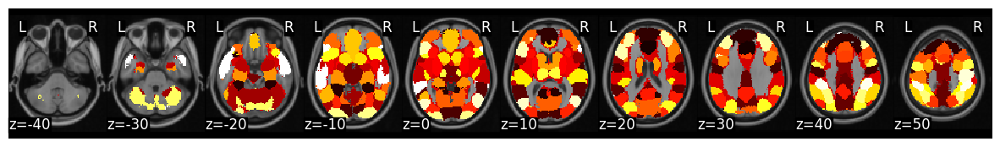

In [112]:
import os
import glob
from nltools.mask import expand_mask, roi_to_brain
from fnl_tools.stats import (compute_ISC_all_roi,
                             create_average_concordance)
from nltools.prefs import MNI_Template
from bids import BIDSLayout, BIDSValidator
from tqdm.notebook import tqdm
from nltools.file_reader import onsets_to_dm
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.linalg import block_diag
import matplotlib.pyplot as plt
import warnings
from nltools.stats import (threshold, 
                           align,
                           zscore,
                           fdr, 
                           isc)
from nltools.data import Brain_Data, Adjacency, Design_Matrix
from nilearn.plotting import plot_glass_brain
warnings.filterwarnings('ignore')

MNI_Template['resolution'] = '2mm' ## mask specify
# base_dir = '/Storage/Data/nes/'

mask = Brain_Data('http://neurovault.org/media/images/2099/Neurosynth%20Parcellation_0.nii.gz')
mask.plot()
#expand this mask into 50 separate regions
mask_x = expand_mask(mask) 
mask_x

csf = Brain_Data('/Volumes/Shaolin/toolboxes_menghan/material/parcellations/csf.nii.gz')

In [5]:
def make_motion_covariates(mc, tr):
    z_mc = zscore(mc)
    all_mc = pd.concat([z_mc, z_mc**2, z_mc.diff(), z_mc.diff()**2], axis=1)
    all_mc.fillna(value=0, inplace=True)
    return Design_Matrix(all_mc, sampling_freq=1/tr)

In [6]:

def load_bids_events(layout, sub, run):
    tr = layout.get_tr(task='logo') 
    n_tr = nib.load(layout.get(subject=sub, run=run, scope='raw', suffix='bold', extension='nii.gz')[0].path).shape[-1]
    onsets = pd.read_csv(os.path.join(path_to_timing, f'sub-{sub}_task-logo_run-{f"{run:02d}"}_events.tsv'), sep='\t')
    onsets.columns = ['Onset', 'Duration', 'Stim']   
    return onsets_to_dm(onsets, sampling_freq=1/tr, run_length=n_tr)


In [106]:
path_to_cases = '/Volumes/Shaolin/modernmedia_menghan/BIDS/1109_modernmedia'
path_to_output = '/Volumes/Shaolin/modernmedia_menghan/denoised/smoothed/beta'
path_to_timing = '/Volumes/Shaolin/modernmedia_menghan/Edat_Files/Event_Files'
# layout = BIDSLayout(path_to_cases, derivatives=True)


## Participants check

In [28]:
outlier_cutoff = 3
tr = 1.25
spike_cutoff = 2.5
smooth = 6

file_list = glob.glob(os.path.join(path_to_cases,'derivatives','*','func','*_bold.nii.gz'))
file_list.sort()
len(file_list)

190

In [29]:
event_list = glob.glob(os.path.join(path_to_timing,'*'))
event_list.sort()
len(event_list)

152

In [94]:
sub_name_all_fmri = []
for i in file_list:
    a = i.split('/')[7]
    sub_name_all_fmri.append(a)

In [96]:
unique_sub_name_fmri = list(set(sub_name_all_fmri))
print(len(unique_sub_name_fmri))

38


In [17]:
sub_name_all_event = []
for i in event_list:
    a = i.split('/')[6].split('_')[0]
    sub_name_all_event.append(a)

In [18]:
unique_sub_name_event = list(set(sub_name_all_event))
print(unique_sub_name_event)

['sub-sid002036', 'sub-sid002477', 'sub-sid001946', 'sub-sid002001', 'sub-sid002307', 'sub-sid002138', 'sub-sid002714', 'sub-sid002620', 'sub-sid002335', 'sub-sid002140', 'sub-sid002700', 'sub-sid001961', 'sub-sid001947', 'sub-sid002716', 'sub-sid002745', 'sub-sid002771', 'sub-sid002701', 'sub-sid002754', 'sub-sid002748', 'sub-sid001962', 'sub-sid002268', 'sub-sid002615', 'sub-sid002749', 'sub-sid001996', 'sub-sid002756', 'sub-sid001945', 'sub-sid002751', 'sub-sid002279', 'sub-sid002747', 'sub-sid002721', 'sub-sid002086', 'sub-sid002731', 'sub-sid002681', 'sub-sid002076', 'sub-sid002528', 'sub-sid002298', 'sub-sid002074', 'sub-sid002736']


In [22]:
len(unique_sub_name_event)

38

In [23]:
sub_exclude = ['sub-sid001962','sub-sid002714','sub-sid001946']
# 1. sid001962 and sid002714 will be excluded from the subject-level analysis
# 2. sid001946 will have runs 1,3,4 included in the subject-level analysis (run 2 excluded from QC)


In [101]:
sub_all = [item for item in unique_sub_name_fmri if item not in sub_exclude]
print(len(sub_all))

35


## Layout format

In [34]:
layout = BIDSLayout(path_to_cases, derivatives=True)
layout
## sub-sid002752

BIDS Layout: ..._menghan/BIDS/1109_modernmedia | Subjects: 39 | Sessions: 0 | Runs: 195

In [39]:
# Subjects with all four runs
runs = layout.get_runs(task='logo')
runs.sort()
subid = layout.get_subjects()

In [117]:
runs

[01, 02, 03, 04]

## Individual GLM

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

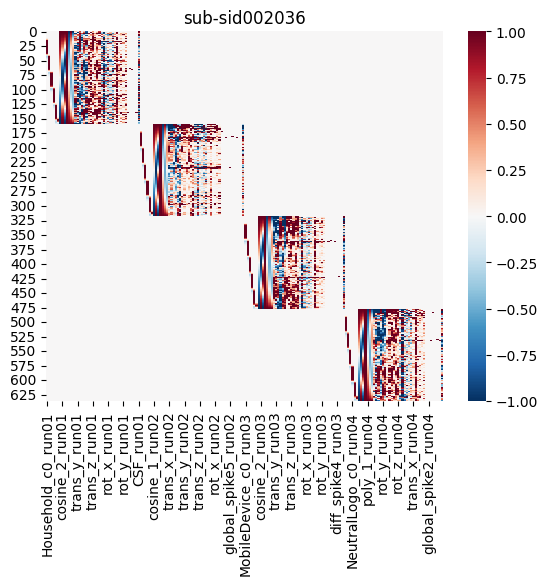

<Figure size 640x480 with 0 Axes>

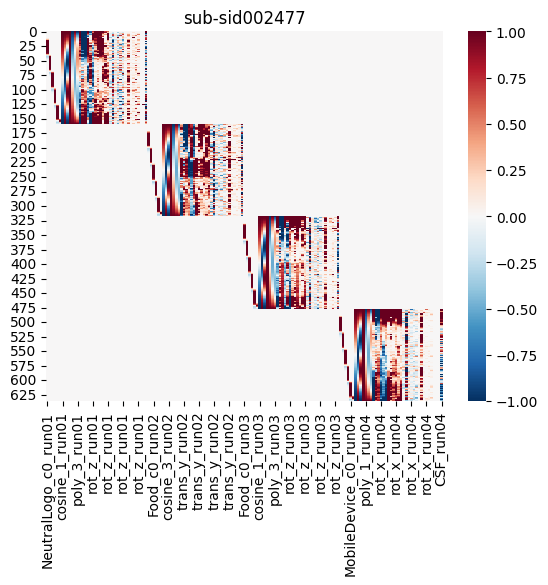

<Figure size 640x480 with 0 Axes>

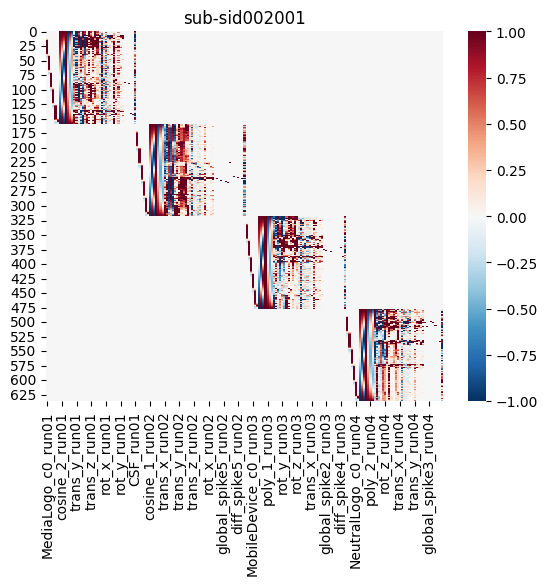

<Figure size 640x480 with 0 Axes>

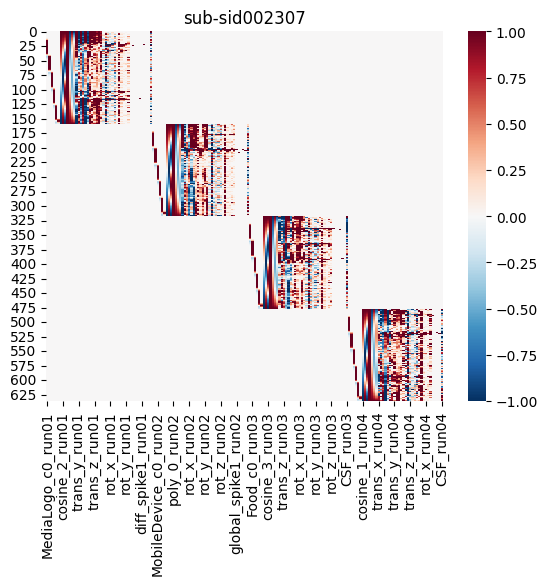

<Figure size 640x480 with 0 Axes>

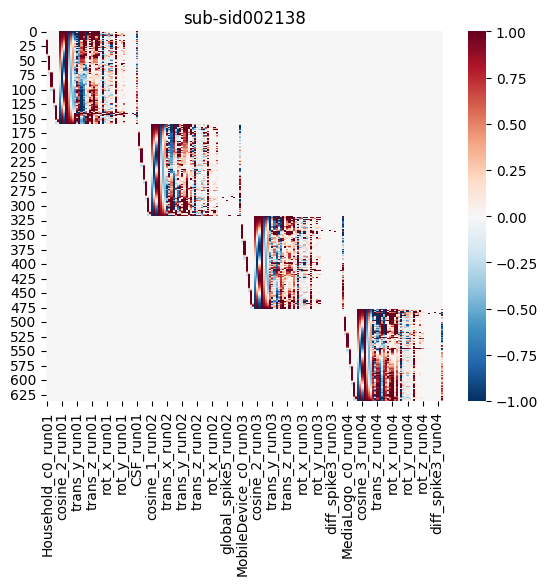

<Figure size 640x480 with 0 Axes>

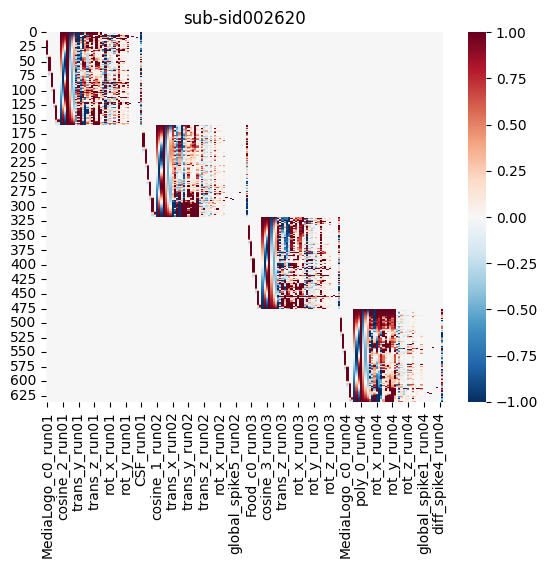

<Figure size 640x480 with 0 Axes>

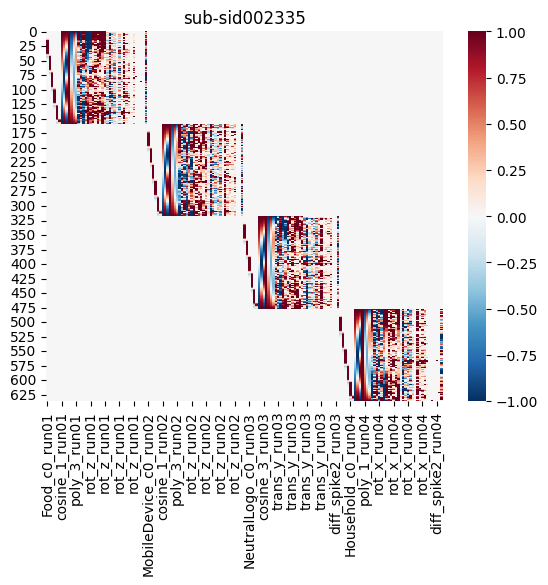

<Figure size 640x480 with 0 Axes>

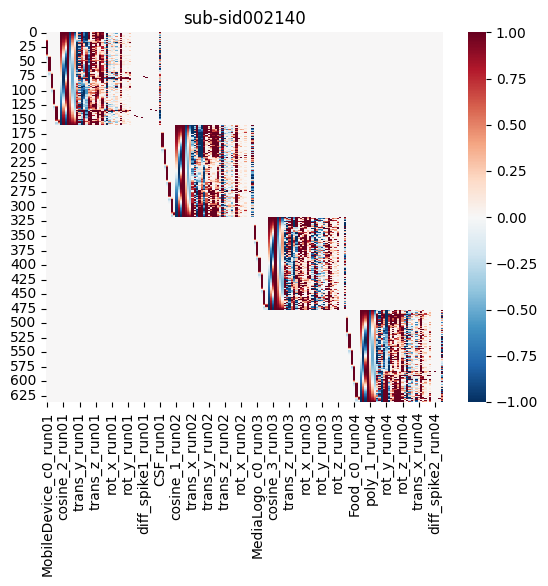

<Figure size 640x480 with 0 Axes>

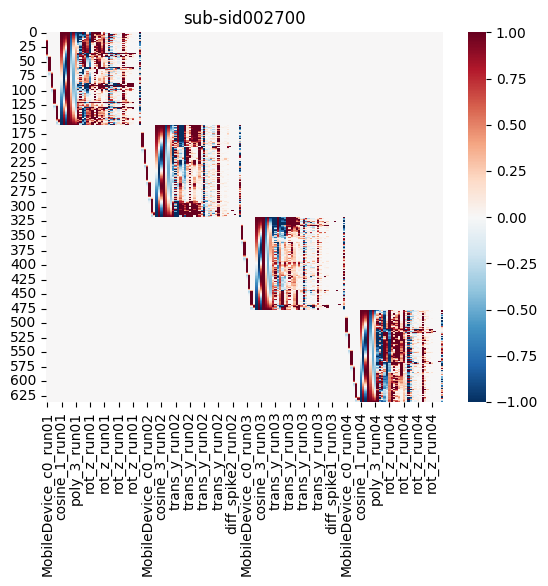

<Figure size 640x480 with 0 Axes>

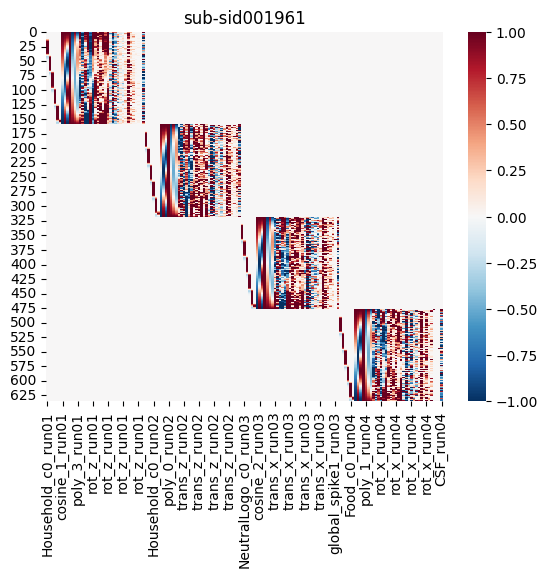

<Figure size 640x480 with 0 Axes>

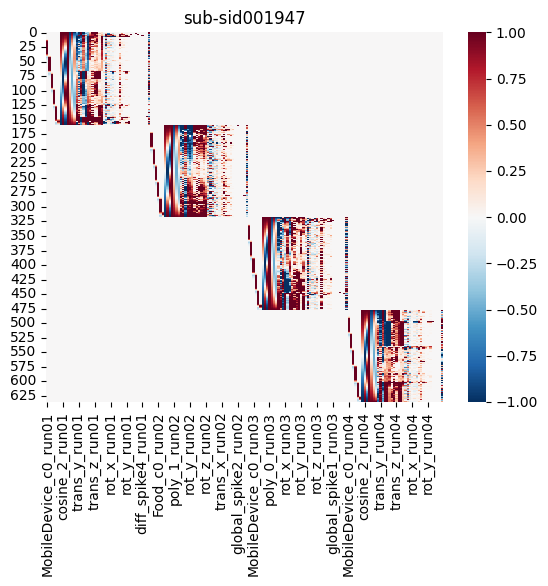

<Figure size 640x480 with 0 Axes>

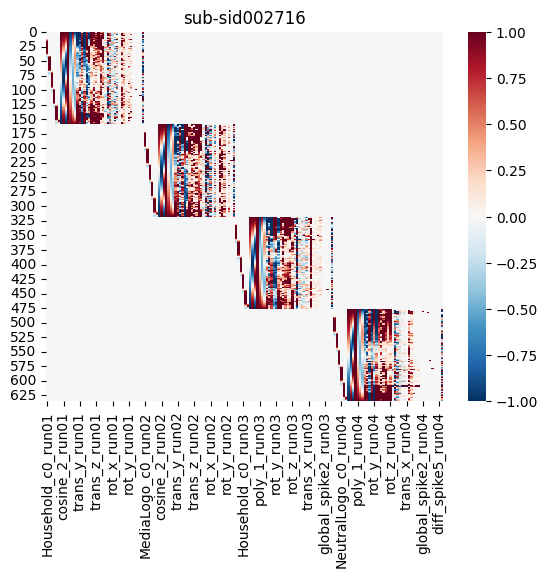

<Figure size 640x480 with 0 Axes>

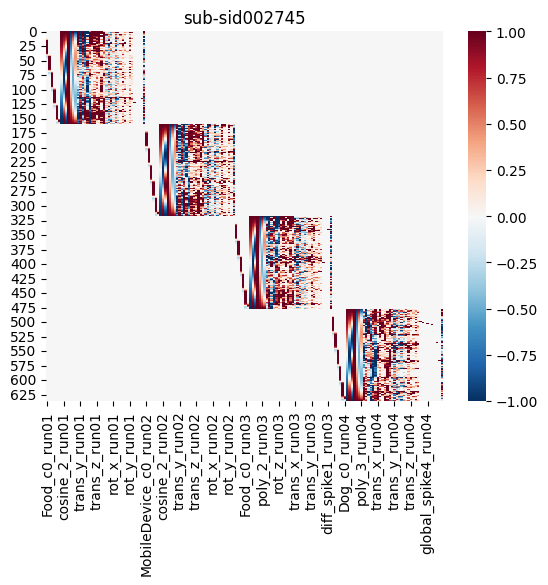

<Figure size 640x480 with 0 Axes>

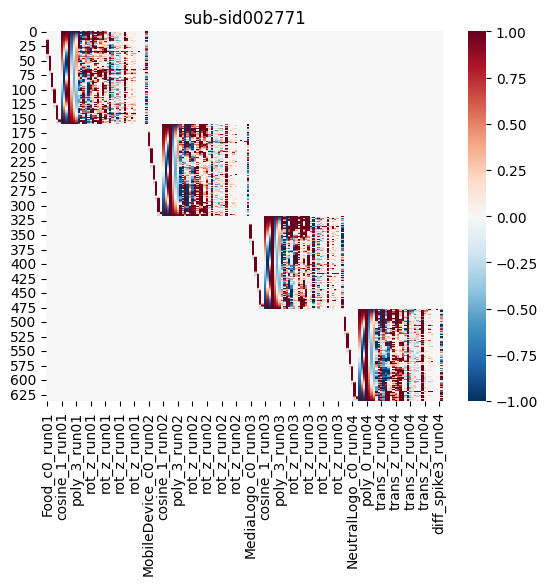

<Figure size 640x480 with 0 Axes>

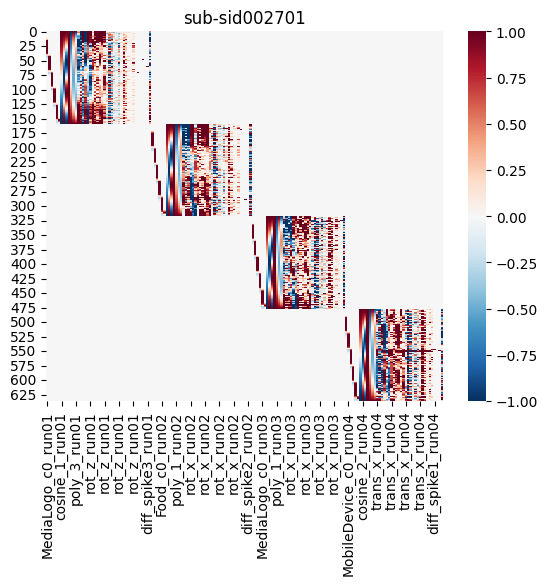

<Figure size 640x480 with 0 Axes>

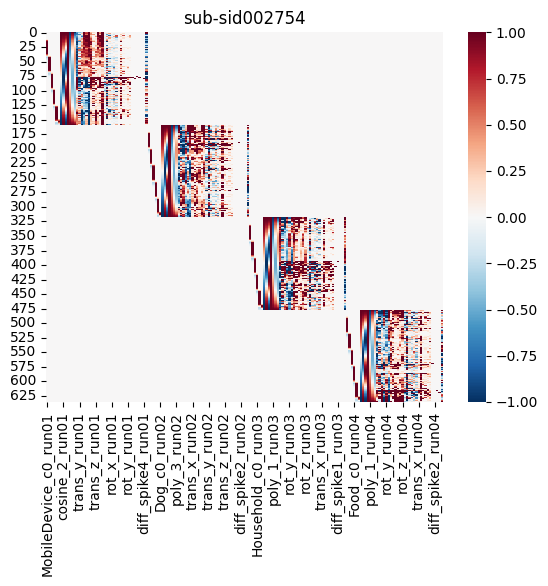

<Figure size 640x480 with 0 Axes>

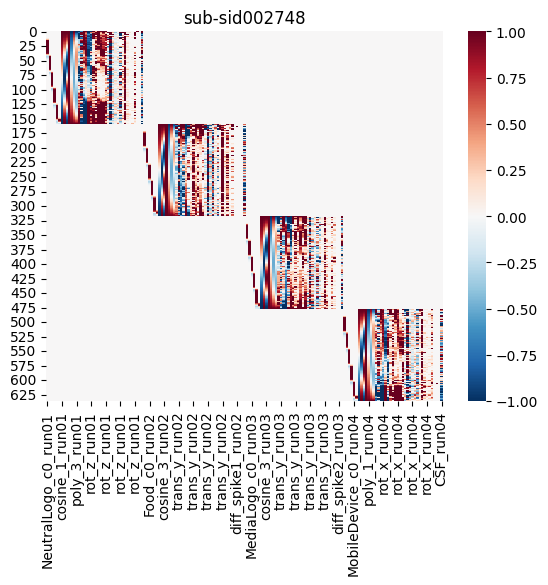

<Figure size 640x480 with 0 Axes>

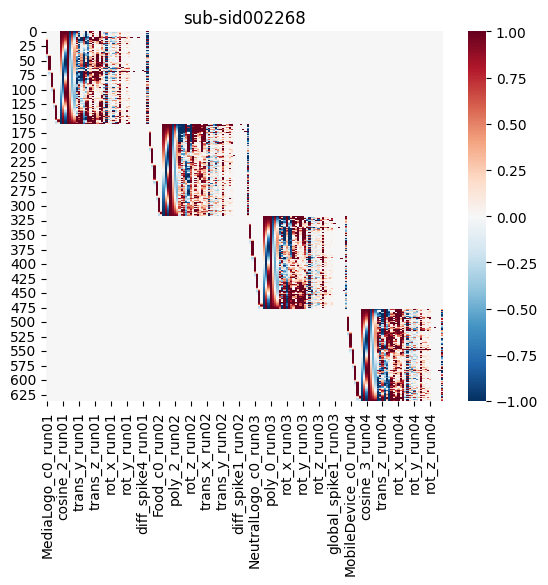

<Figure size 640x480 with 0 Axes>

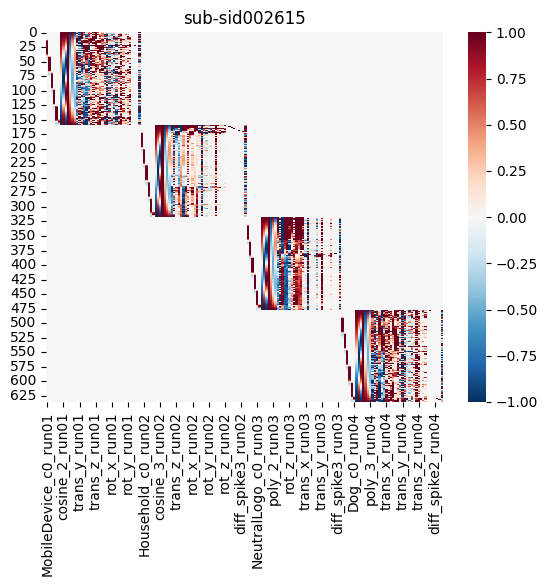

<Figure size 640x480 with 0 Axes>

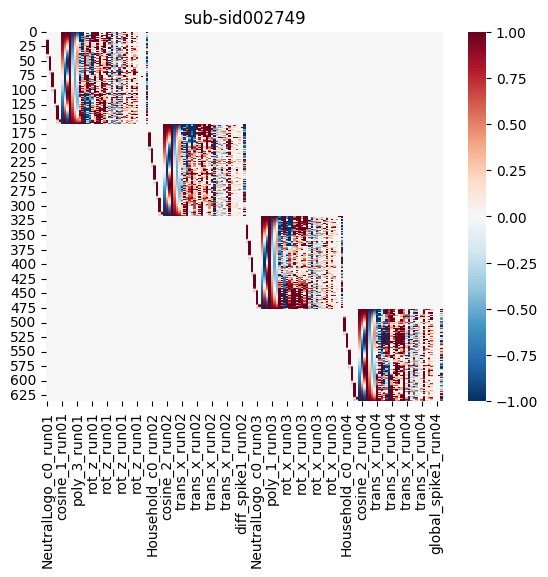

<Figure size 640x480 with 0 Axes>

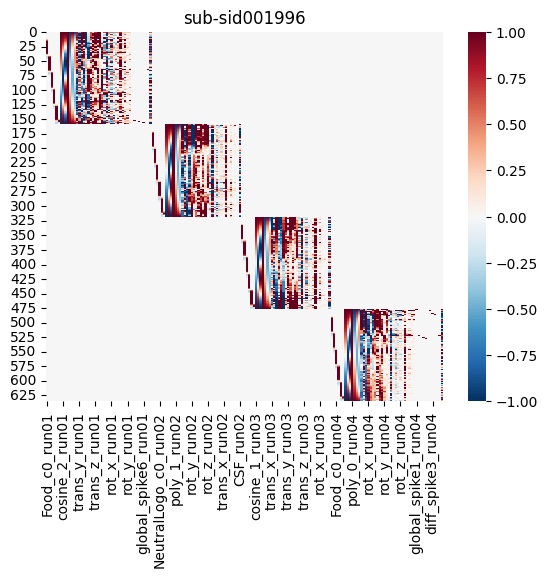

<Figure size 640x480 with 0 Axes>

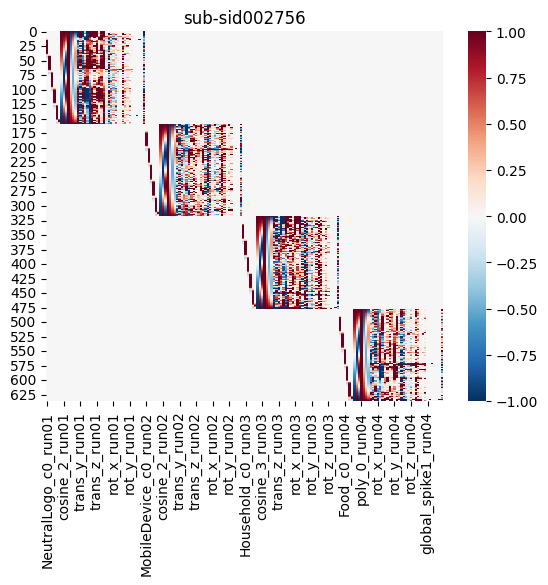

<Figure size 640x480 with 0 Axes>

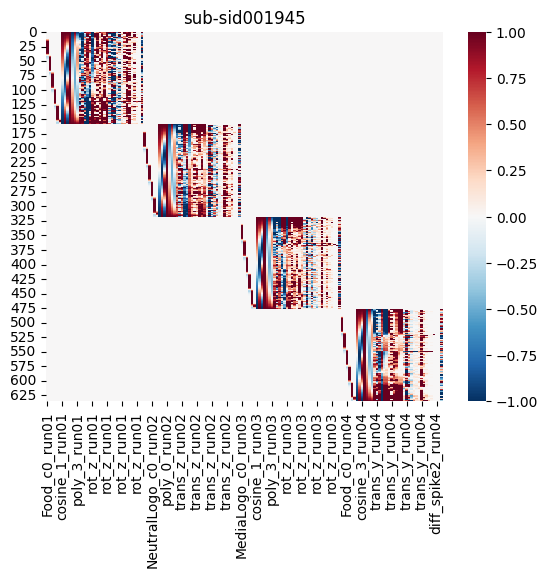

<Figure size 640x480 with 0 Axes>

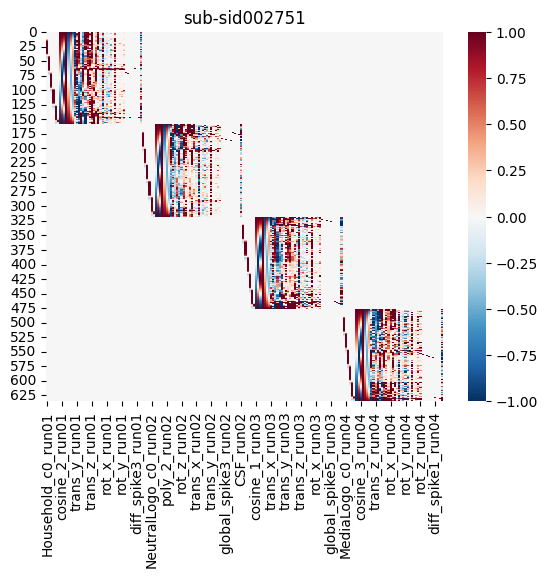

<Figure size 640x480 with 0 Axes>

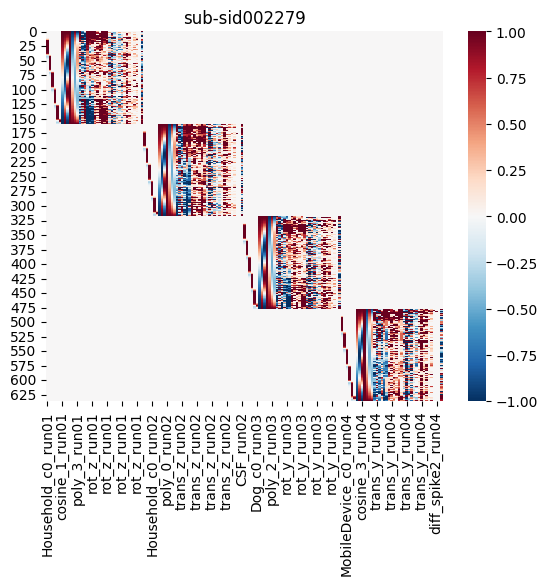

<Figure size 640x480 with 0 Axes>

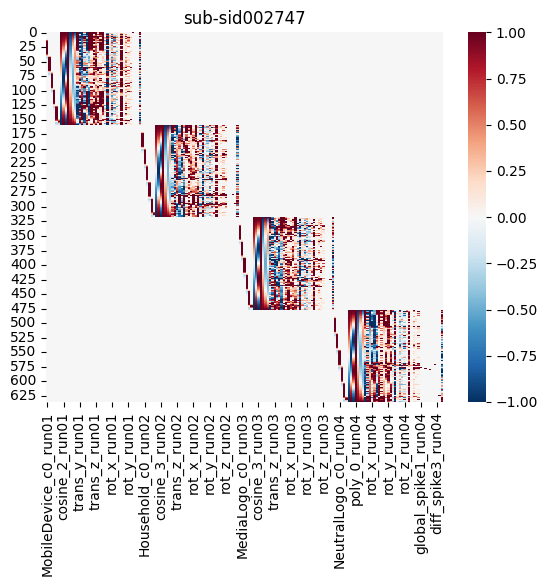

<Figure size 640x480 with 0 Axes>

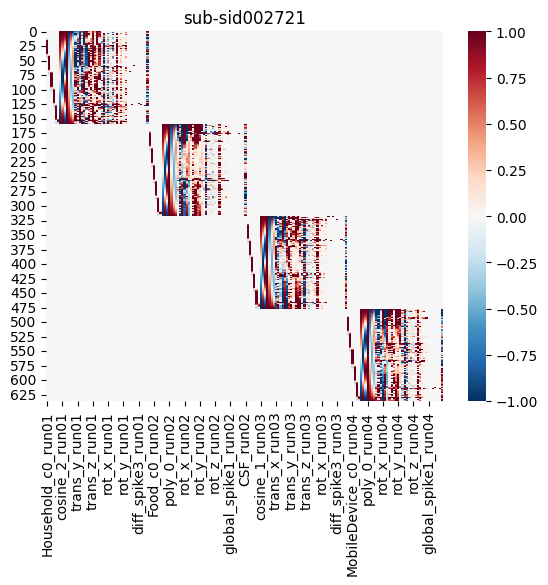

<Figure size 640x480 with 0 Axes>

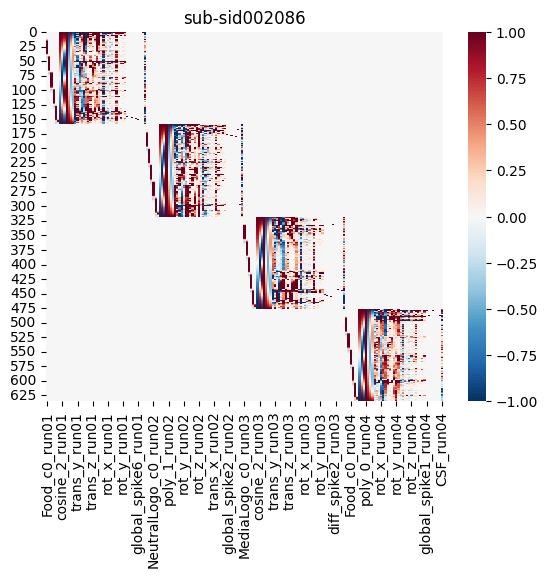

<Figure size 640x480 with 0 Axes>

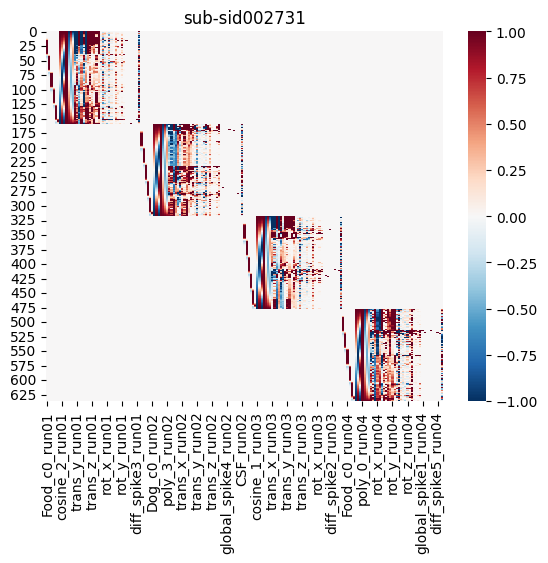

<Figure size 640x480 with 0 Axes>

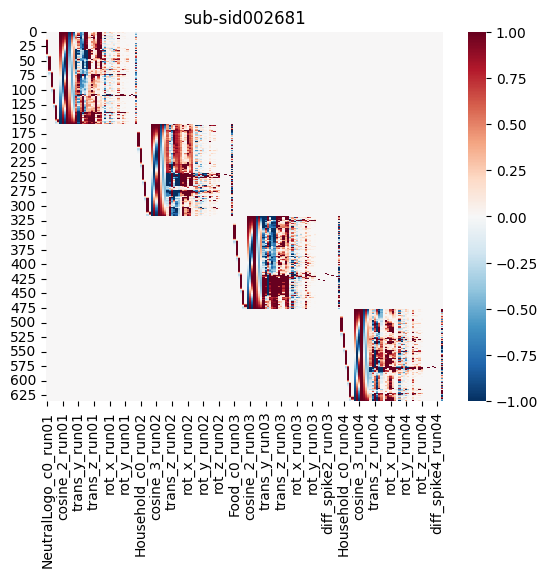

<Figure size 640x480 with 0 Axes>

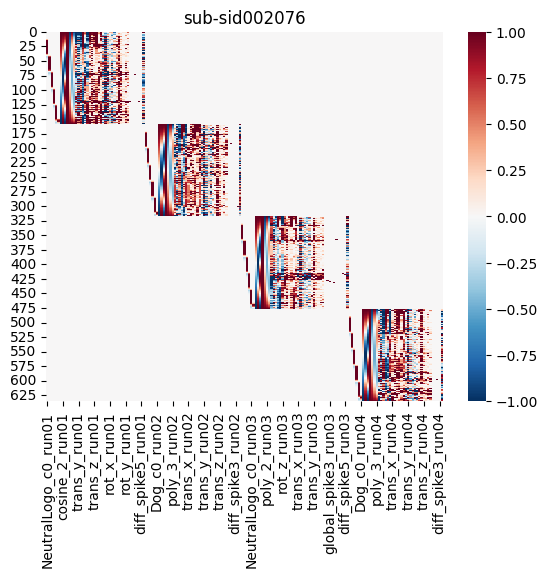

<Figure size 640x480 with 0 Axes>

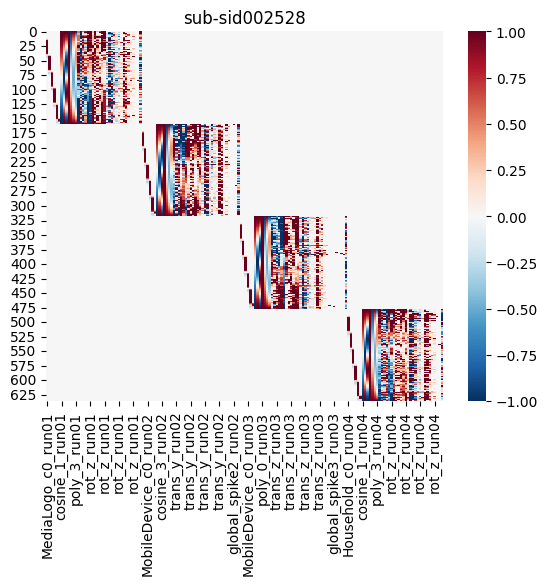

<Figure size 640x480 with 0 Axes>

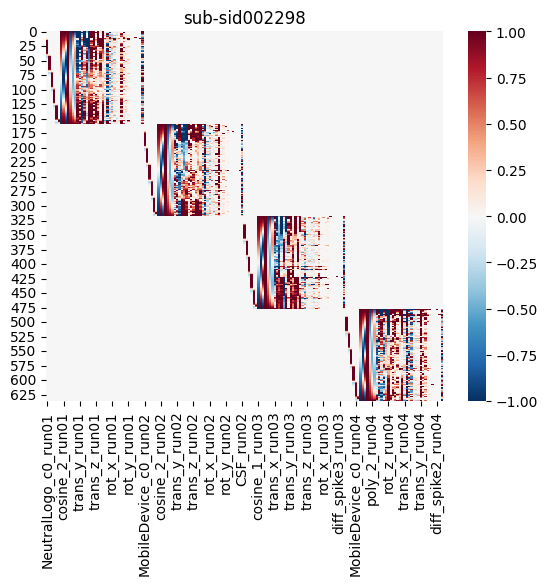

<Figure size 640x480 with 0 Axes>

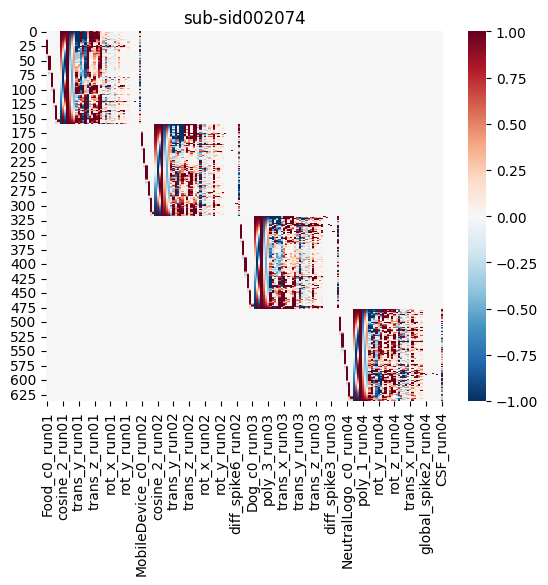

<Figure size 640x480 with 0 Axes>

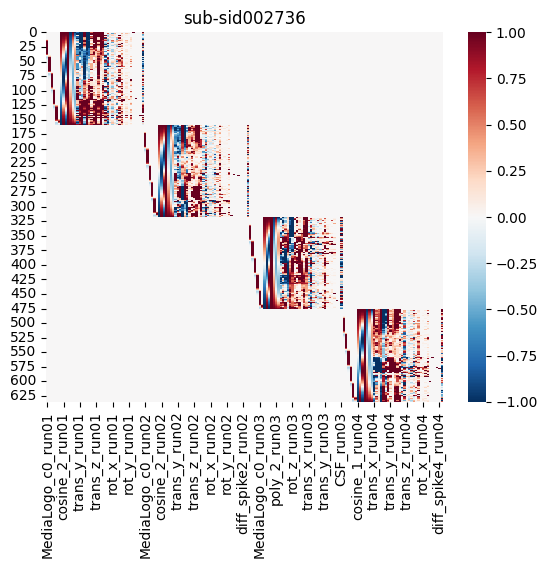

In [113]:


for sub in tqdm(sub_all):
    dm_all = pd.DataFrame()
    dm_all_title = []
    f_data = Brain_Data()
    for run in tqdm(runs):
    
        functional_run_data = glob.glob(os.path.join(path_to_cases,'derivatives',f'{sub}','func',f'{sub}_task-logo_run-{run}*_bold.nii.gz'))
        run_data = Brain_Data(functional_run_data)
        smthd_run_data = run_data.smooth(fwhm=smooth)
        n_tr = run_data.data.shape[0]
        f_data = f_data.append(smthd_run_data)
    
        Event_data = glob.glob(os.path.join(path_to_timing,f'{sub}_task-logo_run-{run}_events.tsv'))
        onsets = pd.read_csv(Event_data[0], sep='\t')
        onsets.columns = ['Onset', 'Duration', 'Stim']
        dm = onsets_to_dm(onsets, sampling_freq=1/tr, run_length=n_tr)
        dm = dm[dm.columns.drop(list(dm.filter(regex='Fix')))] ## drop fixation condition
    
        dm_cov = dm.convolve()
        dm_cov_filt_poly = dm_cov.add_dct_basis(128).add_poly(order=3, include_lower=True)
    
        # Identify Spikes
        spikes = run_data.find_spikes(global_spike_cutoff=outlier_cutoff, diff_spike_cutoff=outlier_cutoff)
        spikes = Design_Matrix(spikes.iloc[:,1:], sampling_freq=1/tr)
    
        # Load fMRIprep Confounds
        confounds = pd.read_csv(os.path.join(path_to_cases,'derivatives', sub, 'func', f'{sub}_task-logo_run-{run}_desc-confounds_timeseries.tsv'), sep='\t')
    
        # motion covars
        mc = confounds[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]
        mc_cov = make_motion_covariates(mc, tr)
    
        dm_conv_filt_poly_cov = dm_cov_filt_poly.append(mc_cov, axis=1).append(spikes, axis=1)
        dm_conv_filt_poly_cov['CSF'] = zscore(pd.Series(run_data.extract_roi(csf.threshold(upper=0.85, binarize=True))))
        # dm_conv_filt_poly_cov.heatmap(cmap='RdBu_r', vmin=-1,vmax=1)     
        dm_all = pd.DataFrame(block_diag(dm_all,dm_conv_filt_poly_cov))
    
        dm_title = dm_conv_filt_poly_cov.columns.tolist()
        dm_title_new =[ i + '_run' + str(run) for i in dm_title]
        dm_all_title.extend(dm_title_new)

    dm_all.columns = dm_all_title

    plt.figure()
    sub_fig, _ = plt.subplots()
    sns.heatmap(dm_all,cmap='RdBu_r', vmin=-1,vmax=1).set(title=sub)
    f_data.X = dm_all
    stats_data = f_data.regress()
    
    # Household
    Household = np.where(f_data.X.columns.str.contains('Household'),0.25,0)
    Household_data = stats_data['beta'] * Household
        
    # MobileDevice
    MobileDevice = np.where(f_data.X.columns.str.contains('MobileDevice'),0.25,0)
    MobileDevice_data = stats_data['beta'] * MobileDevice
    
    # NeutralLogo
    NeutralLogo = np.where(f_data.X.columns.str.contains('NeutralLogo'),0.25,0)
    NeutralLogo_data = stats_data['beta'] * NeutralLogo
    
    # Food
    Food = np.where(f_data.X.columns.str.contains('Food'),0.25,0)
    food_data = stats_data['beta'] * Food
    
    # MediaLogo
    MediaLogo = np.where(f_data.X.columns.str.contains('MediaLogo'),0.25,0)
    MediaLogo_data = stats_data['beta'] * MediaLogo
    
    ## save the data
    Household_data.data = np.float32(Household_data.data) # cast as float32 to reduce storage space
    MobileDevice_data.data = np.float32(MobileDevice_data.data)
    NeutralLogo_data.data = np.float32(NeutralLogo_data.data)
    MediaLogo_data.data = np.float32(MediaLogo_data.data)
    food_data.data = np.float32(food_data.data)


    
    Household_data.write(os.path.join(path_to_output, f'{sub}_Household_beta.nii.gz'))
    MobileDevice_data.write(os.path.join(path_to_output, f'{sub}_MobileDevice_beta.nii.gz'))
    NeutralLogo_data.write(os.path.join(path_to_output, f'{sub}_NeutralLogo_beta.nii.gz'))
    MediaLogo_data.write(os.path.join(path_to_output, f'{sub}_MediaLogo_beta.nii.gz'))
    food_data.write(os.path.join(path_to_output, f'{sub}_Food_beta.nii.gz'))
    
    



In [116]:
dm_all_title

['MediaLogo_c0_run01',
 'NeutralLogo_c0_run01',
 'MobileDevice_c0_run01',
 'Food_c0_run01',
 'Household_c0_run01',
 'Dog_c0_run01',
 'cosine_1_run01',
 'cosine_2_run01',
 'cosine_3_run01',
 'poly_0_run01',
 'poly_1_run01',
 'poly_2_run01',
 'poly_3_run01',
 'trans_x_run01',
 'trans_y_run01',
 'trans_z_run01',
 'rot_x_run01',
 'rot_y_run01',
 'rot_z_run01',
 'trans_x_run01',
 'trans_y_run01',
 'trans_z_run01',
 'rot_x_run01',
 'rot_y_run01',
 'rot_z_run01',
 'trans_x_run01',
 'trans_y_run01',
 'trans_z_run01',
 'rot_x_run01',
 'rot_y_run01',
 'rot_z_run01',
 'trans_x_run01',
 'trans_y_run01',
 'trans_z_run01',
 'rot_x_run01',
 'rot_y_run01',
 'rot_z_run01',
 'global_spike1_run01',
 'diff_spike1_run01',
 'diff_spike2_run01',
 'diff_spike3_run01',
 'CSF_run01',
 'MediaLogo_c0_run02',
 'Household_c0_run02',
 'MobileDevice_c0_run02',
 'NeutralLogo_c0_run02',
 'Food_c0_run02',
 'Dog_c0_run02',
 'cosine_1_run02',
 'cosine_2_run02',
 'cosine_3_run02',
 'poly_0_run02',
 'poly_1_run02',
 'poly_2

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

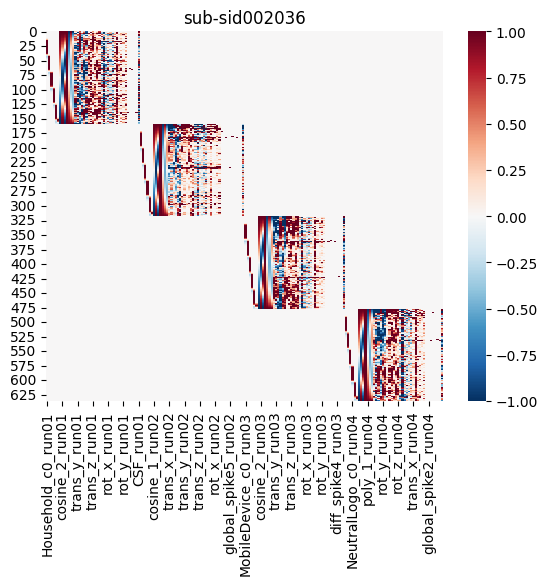

<Figure size 640x480 with 0 Axes>

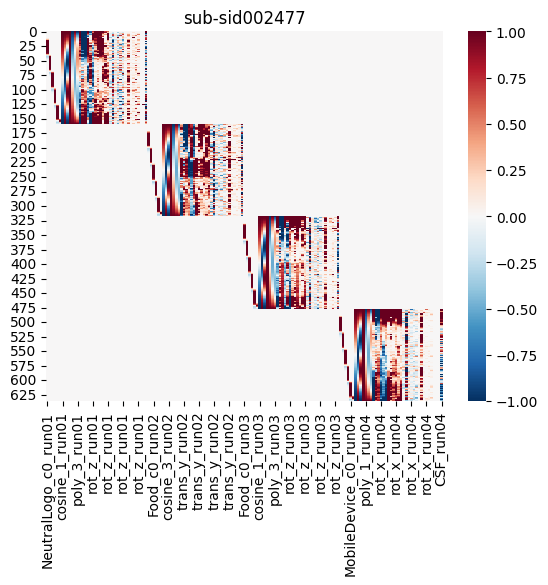

<Figure size 640x480 with 0 Axes>

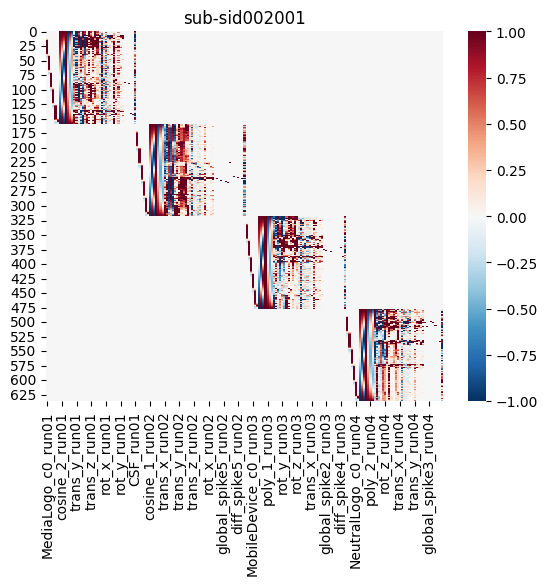

<Figure size 640x480 with 0 Axes>

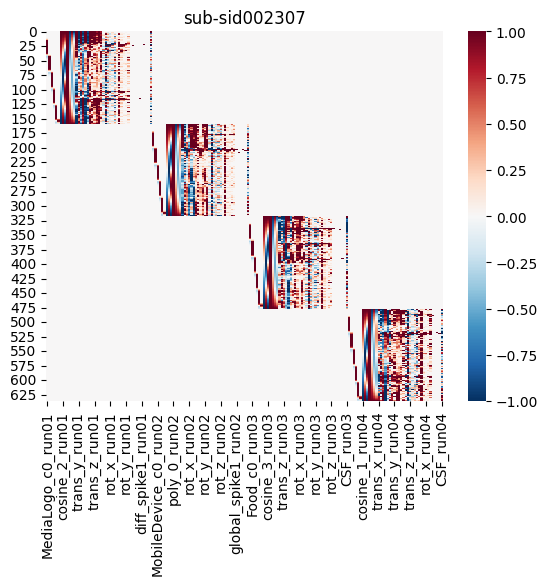

<Figure size 640x480 with 0 Axes>

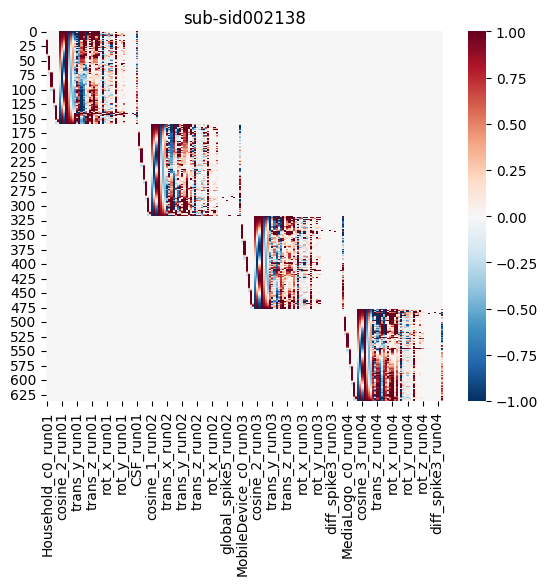

<Figure size 640x480 with 0 Axes>

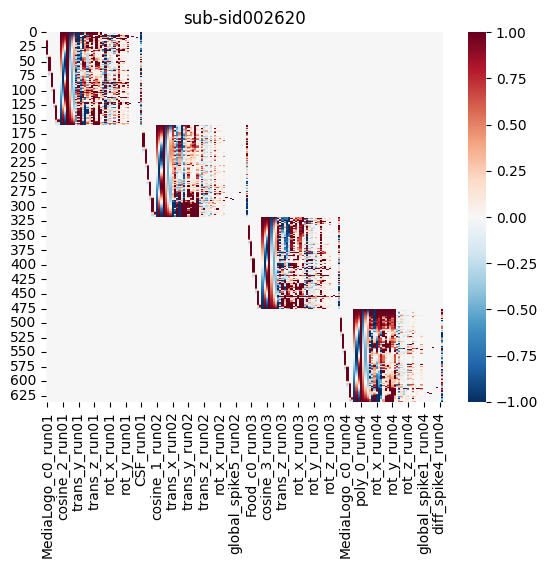

<Figure size 640x480 with 0 Axes>

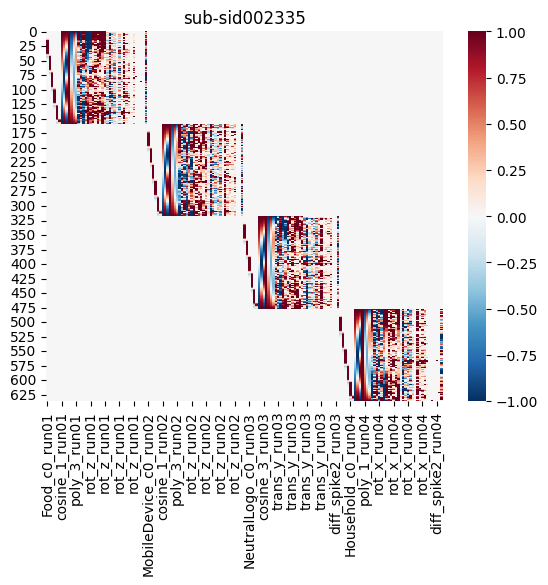

<Figure size 640x480 with 0 Axes>

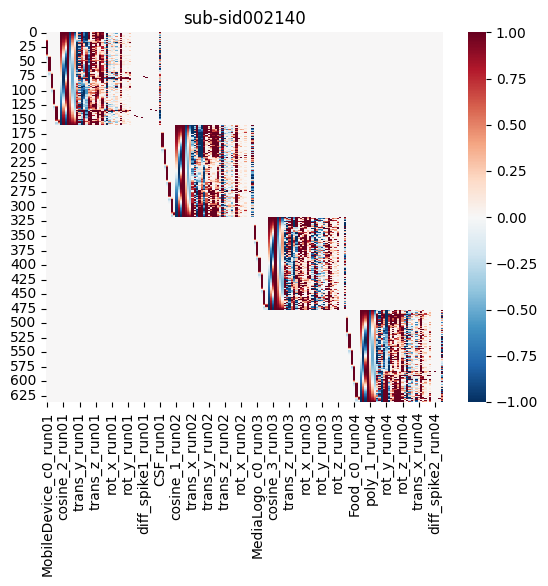

<Figure size 640x480 with 0 Axes>

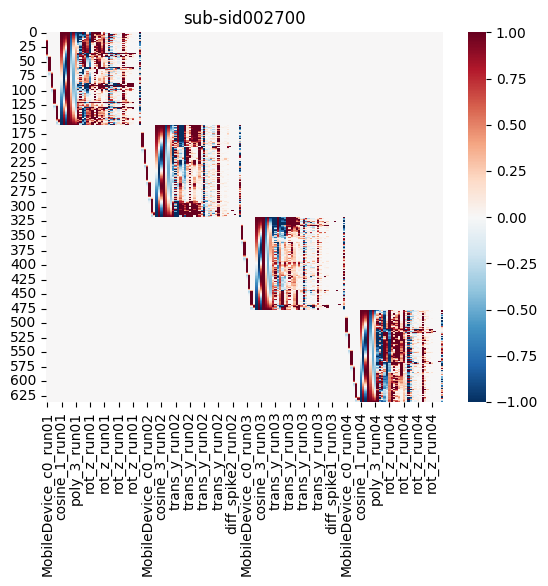

<Figure size 640x480 with 0 Axes>

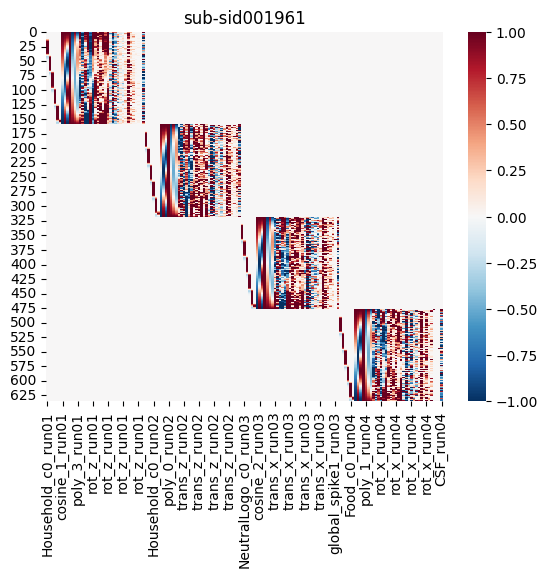

<Figure size 640x480 with 0 Axes>

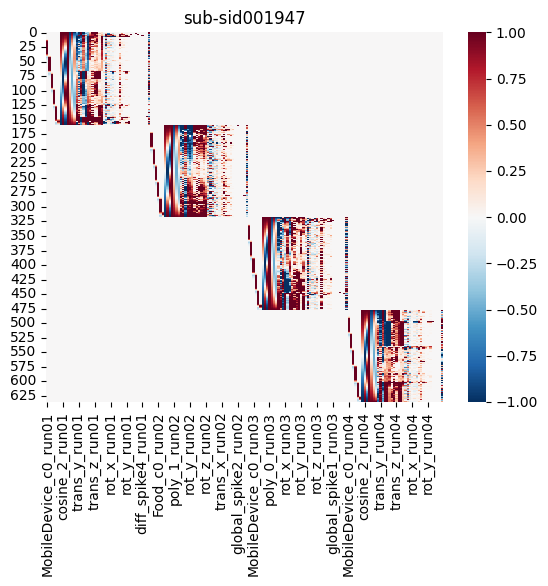

<Figure size 640x480 with 0 Axes>

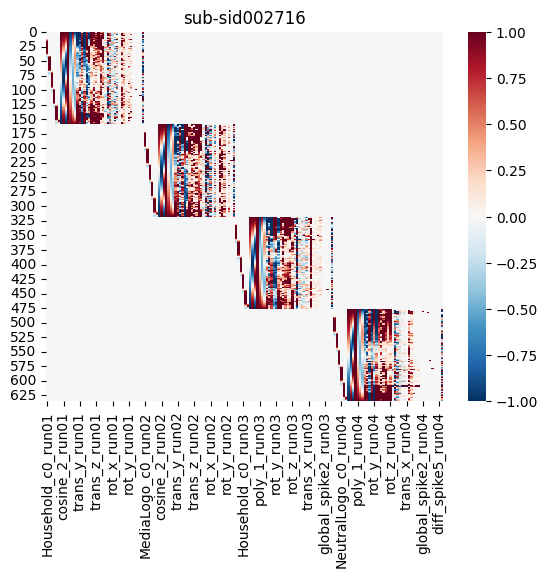

<Figure size 640x480 with 0 Axes>

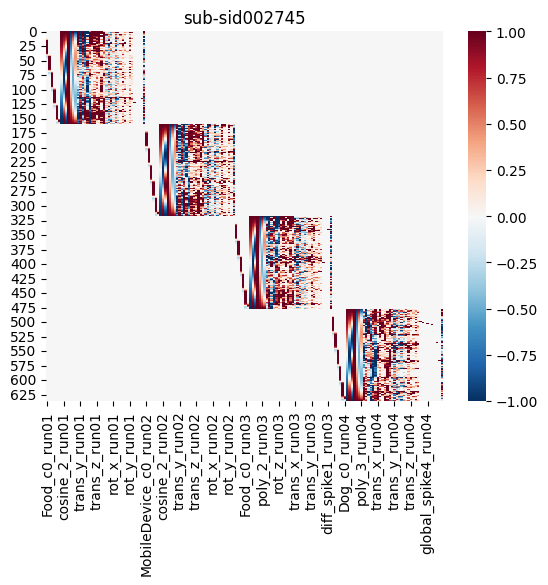

<Figure size 640x480 with 0 Axes>

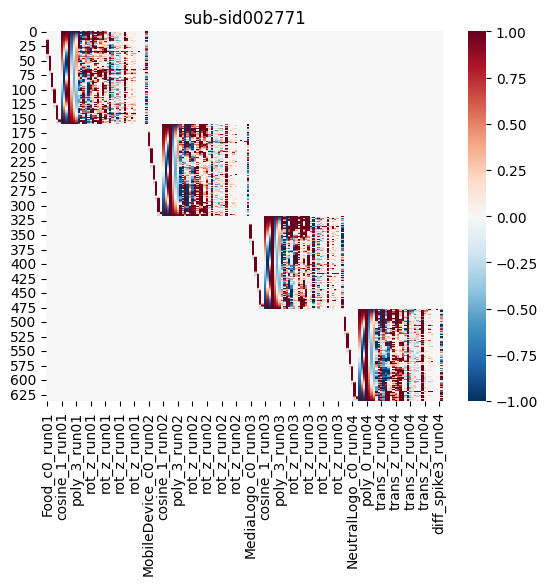

<Figure size 640x480 with 0 Axes>

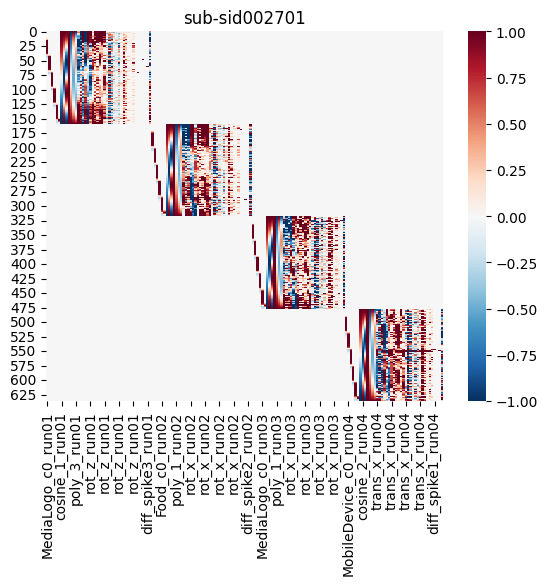

<Figure size 640x480 with 0 Axes>

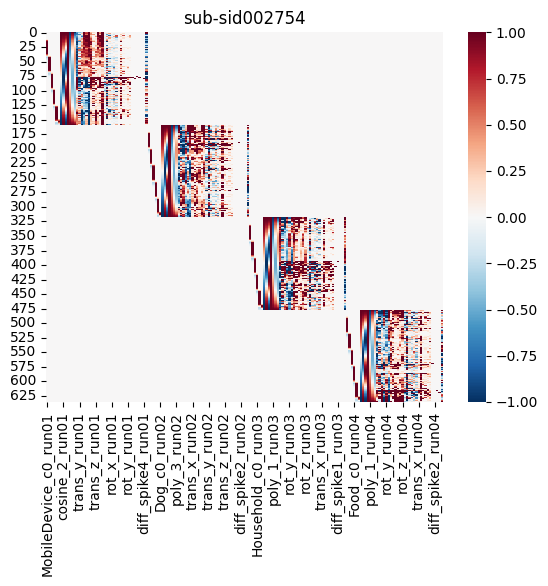

<Figure size 640x480 with 0 Axes>

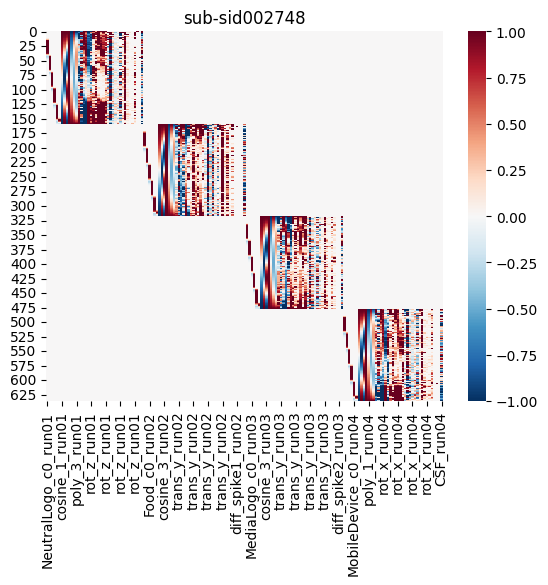

<Figure size 640x480 with 0 Axes>

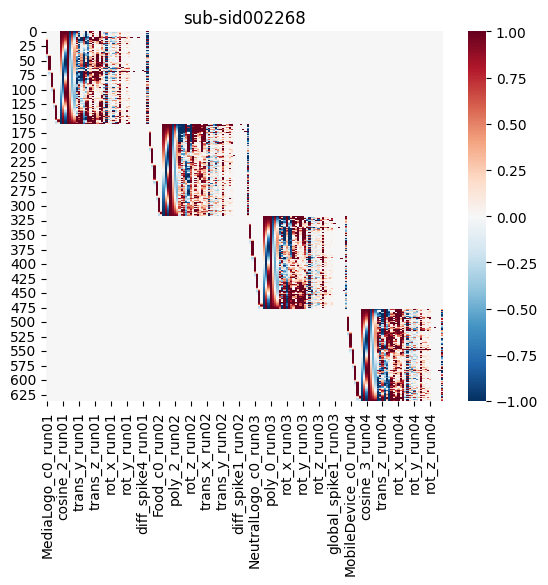

<Figure size 640x480 with 0 Axes>

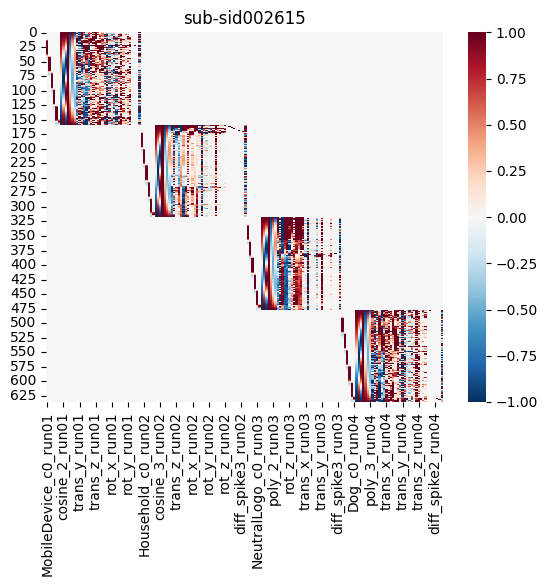

<Figure size 640x480 with 0 Axes>

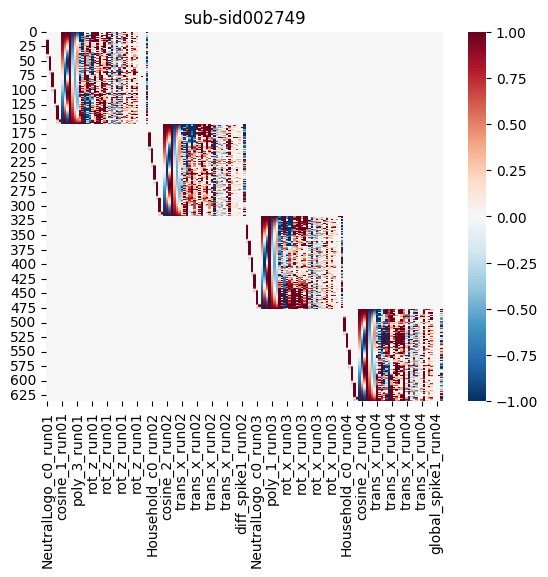

<Figure size 640x480 with 0 Axes>

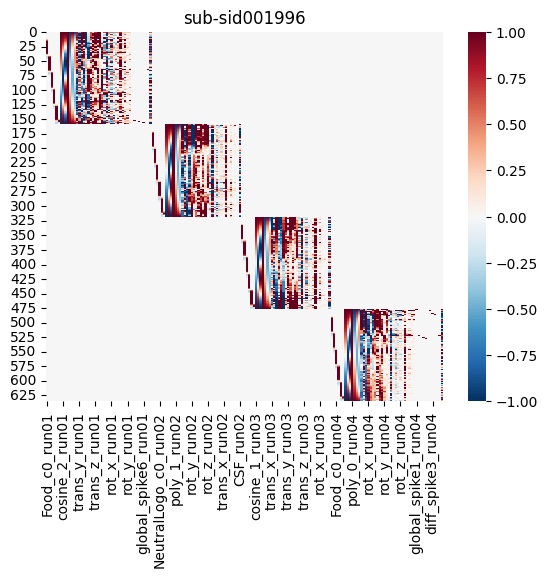

<Figure size 640x480 with 0 Axes>

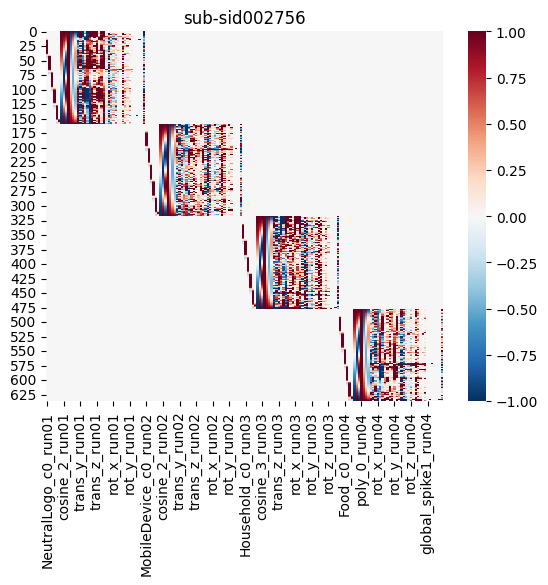

<Figure size 640x480 with 0 Axes>

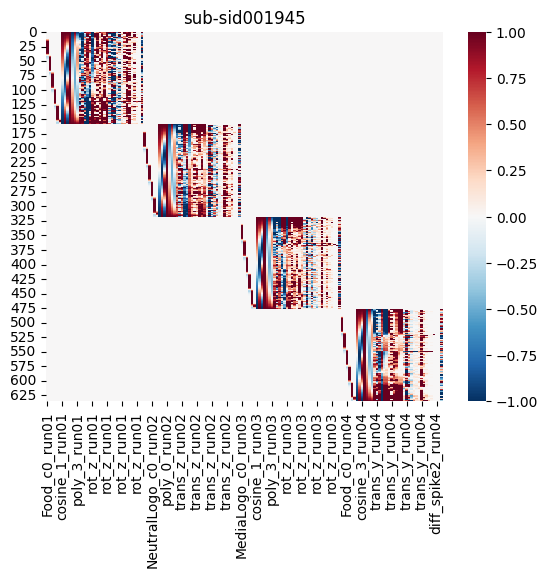

<Figure size 640x480 with 0 Axes>

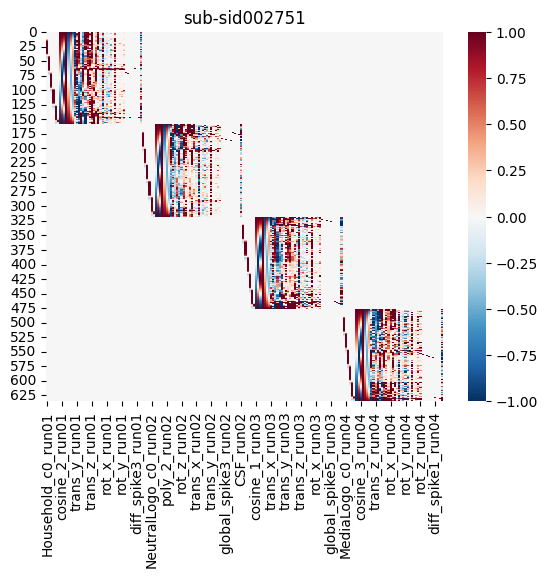

<Figure size 640x480 with 0 Axes>

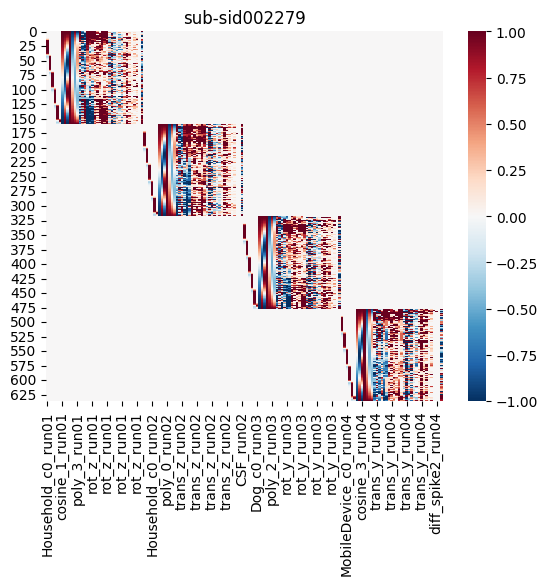

<Figure size 640x480 with 0 Axes>

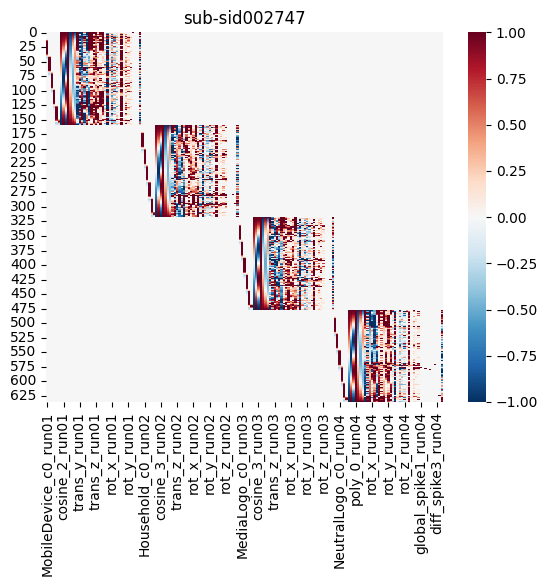

<Figure size 640x480 with 0 Axes>

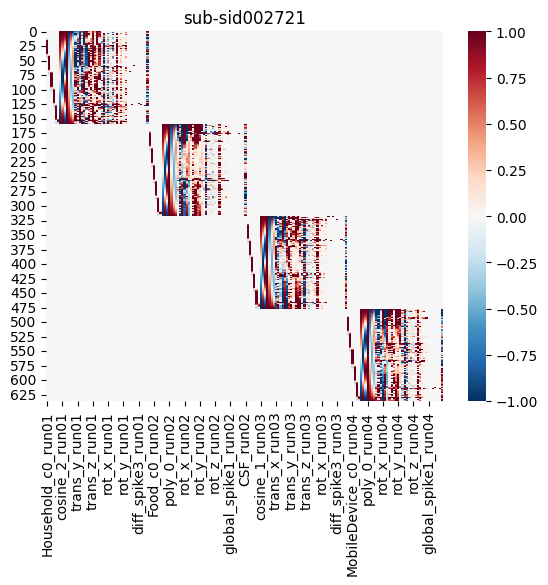

<Figure size 640x480 with 0 Axes>

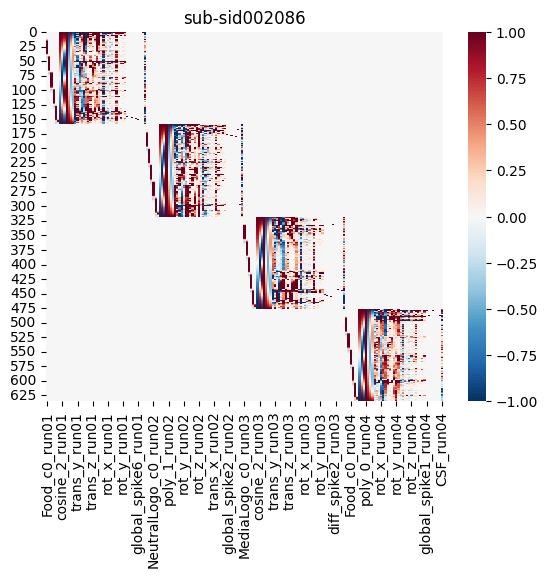

<Figure size 640x480 with 0 Axes>

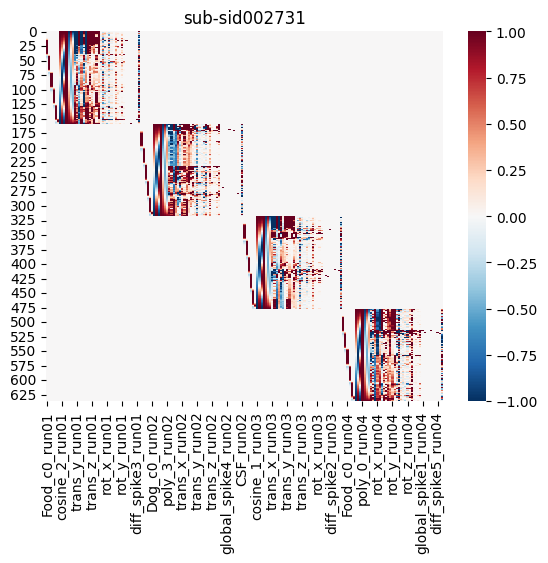

<Figure size 640x480 with 0 Axes>

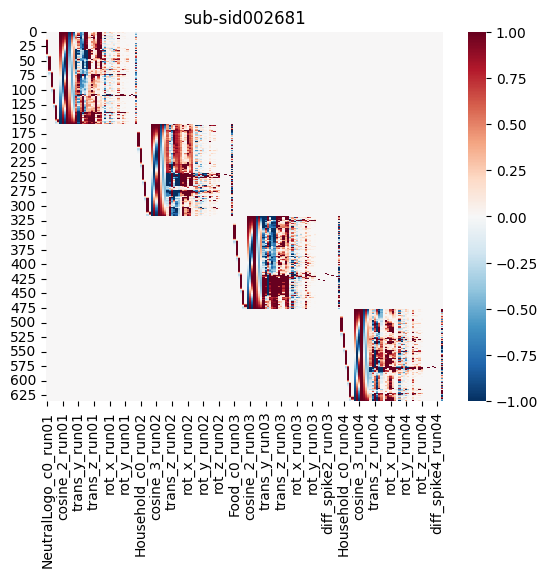

<Figure size 640x480 with 0 Axes>

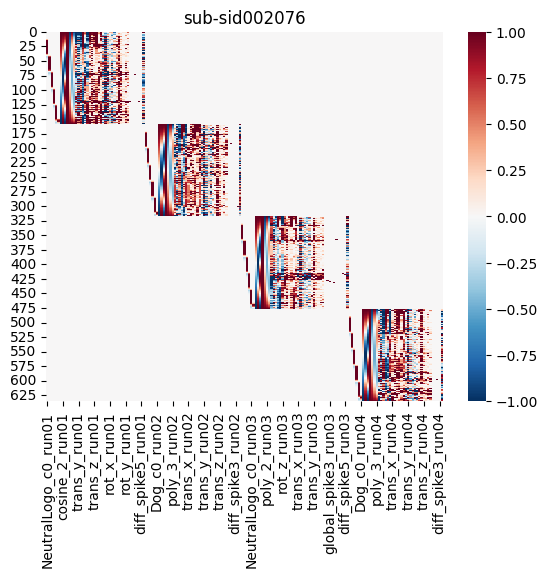

<Figure size 640x480 with 0 Axes>

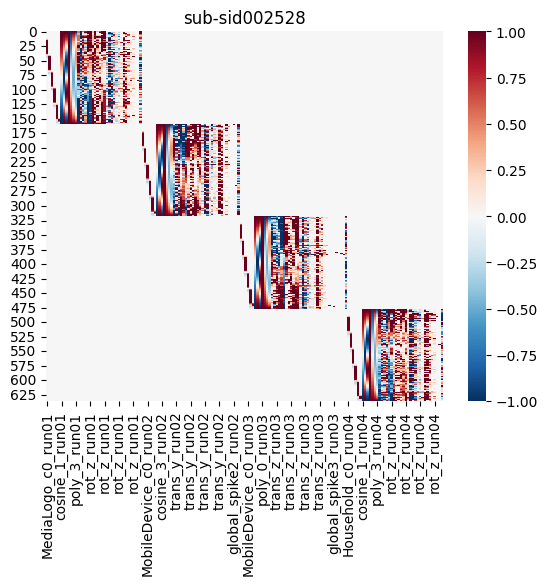

<Figure size 640x480 with 0 Axes>

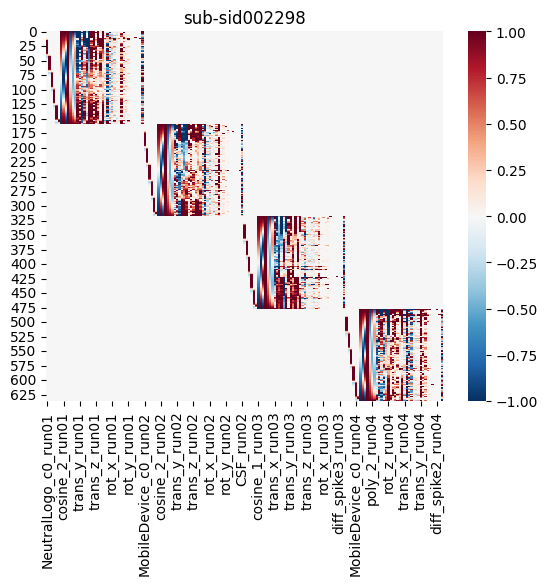

<Figure size 640x480 with 0 Axes>

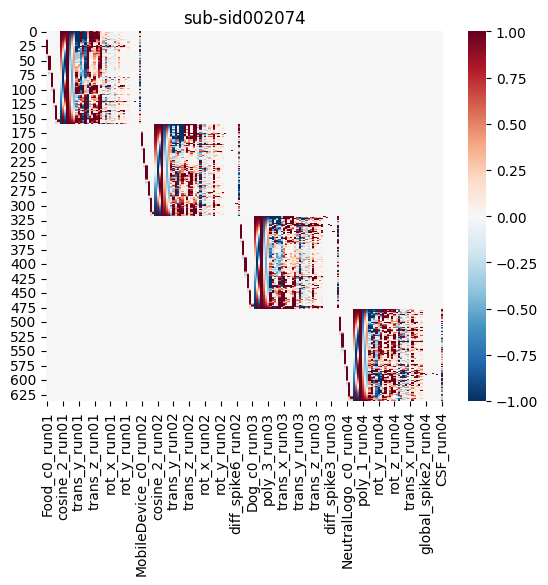

<Figure size 640x480 with 0 Axes>

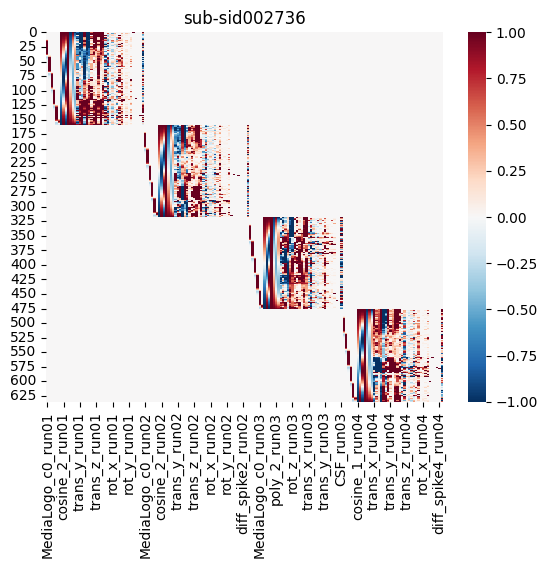

In [114]:
path_to_output_unsmooth = '/Volumes/Shaolin/modernmedia_menghan/denoised/unsmoothed/beta'

for sub in tqdm(sub_all):
    dm_all = pd.DataFrame()
    dm_all_title = []
    f_data = Brain_Data()
    for run in tqdm(runs):
    
        functional_run_data = glob.glob(os.path.join(path_to_cases,'derivatives',f'{sub}','func',f'{sub}_task-logo_run-{run}*_bold.nii.gz'))
        run_data = Brain_Data(functional_run_data)
        # smthd_run_data = run_data.smooth(fwhm=smooth)
        n_tr = run_data.data.shape[0]
        f_data = f_data.append(run_data)
    
        Event_data = glob.glob(os.path.join(path_to_timing,f'{sub}_task-logo_run-{run}_events.tsv'))
        onsets = pd.read_csv(Event_data[0], sep='\t')
        onsets.columns = ['Onset', 'Duration', 'Stim']
        dm = onsets_to_dm(onsets, sampling_freq=1/tr, run_length=n_tr)
        dm = dm[dm.columns.drop(list(dm.filter(regex='Fix')))] ## drop fixation condition
    
        dm_cov = dm.convolve()
        dm_cov_filt_poly = dm_cov.add_dct_basis(128).add_poly(order=3, include_lower=True)
    
        # Identify Spikes
        spikes = run_data.find_spikes(global_spike_cutoff=outlier_cutoff, diff_spike_cutoff=outlier_cutoff)
        spikes = Design_Matrix(spikes.iloc[:,1:], sampling_freq=1/tr)
    
        # Load fMRIprep Confounds
        confounds = pd.read_csv(os.path.join(path_to_cases,'derivatives', sub, 'func', f'{sub}_task-logo_run-{run}_desc-confounds_timeseries.tsv'), sep='\t')
    
        # motion covars
        mc = confounds[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]
        mc_cov = make_motion_covariates(mc, tr)
    
        dm_conv_filt_poly_cov = dm_cov_filt_poly.append(mc_cov, axis=1).append(spikes, axis=1)
        dm_conv_filt_poly_cov['CSF'] = zscore(pd.Series(run_data.extract_roi(csf.threshold(upper=0.85, binarize=True))))
        # dm_conv_filt_poly_cov.heatmap(cmap='RdBu_r', vmin=-1,vmax=1)     
        dm_all = pd.DataFrame(block_diag(dm_all,dm_conv_filt_poly_cov))
    
        dm_title = dm_conv_filt_poly_cov.columns.tolist()
        dm_title_new =[ i + '_run' + str(run) for i in dm_title]
        dm_all_title.extend(dm_title_new)

    dm_all.columns = dm_all_title

    plt.figure()
    sub_fig, _ = plt.subplots()
    sns.heatmap(dm_all,cmap='RdBu_r', vmin=-1,vmax=1).set(title=sub)
    f_data.X = dm_all
    stats_data = f_data.regress()
    
    # Household
    Household = np.where(f_data.X.columns.str.contains('Household'),0.25,0)
    Household_data = stats_data['beta'] * Household
        
    # MobileDevice
    MobileDevice = np.where(f_data.X.columns.str.contains('MobileDevice'),0.25,0)
    MobileDevice_data = stats_data['beta'] * MobileDevice
    
    # NeutralLogo
    NeutralLogo = np.where(f_data.X.columns.str.contains('NeutralLogo'),0.25,0)
    NeutralLogo_data = stats_data['beta'] * NeutralLogo
    
    # Food
    Food = np.where(f_data.X.columns.str.contains('Food'),0.25,0)
    food_data = stats_data['beta'] * Food
    
    # MediaLogo
    MediaLogo = np.where(f_data.X.columns.str.contains('MediaLogo'),0.25,0)
    MediaLogo_data = stats_data['beta'] * MediaLogo
    
    ## save the data
    Household_data.data = np.float32(Household_data.data) # cast as float32 to reduce storage space
    MobileDevice_data.data = np.float32(MobileDevice_data.data)
    NeutralLogo_data.data = np.float32(NeutralLogo_data.data)
    MediaLogo_data.data = np.float32(MediaLogo_data.data)
    food_data.data = np.float32(food_data.data)

    
    Household_data.write(os.path.join(path_to_output_unsmooth, f'{sub}_Household_beta.nii.gz'))
    MobileDevice_data.write(os.path.join(path_to_output_unsmooth, f'{sub}_MobileDevice_beta.nii.gz'))
    NeutralLogo_data.write(os.path.join(path_to_output_unsmooth, f'{sub}_NeutralLogo_beta.nii.gz'))
    MediaLogo_data.write(os.path.join(path_to_output_unsmooth, f'{sub}_MediaLogo_beta.nii.gz'))
    food_data.write(os.path.join(path_to_output_unsmooth, f'{sub}_Food_beta.nii.gz'))
    



### averaged entire brain signal for each TR for QC

In [136]:
run = runs[0]
time_series_data = pd.DataFrame()
for sub in tqdm(sub_all):
    sub_time = pd.DataFrame()
    functional_run_data = glob.glob(os.path.join(path_to_cases,'derivatives',f'{sub}','func',f'{sub}_task-logo_run-{run}*_bold.nii.gz'))
    run_data = Brain_Data(functional_run_data)
    sub_time['signal'] = run_data.mean(axis = 1)
    sub_time['timepoint'] = list(range(run_data.mean(axis = 1).shape[0]))
    sub_time['name'] = sub
    time_series_data = pd.concat([time_series_data,sub_time],axis = 0)

  0%|          | 0/35 [00:00<?, ?it/s]

<Axes: xlabel='timepoint', ylabel='signal'>

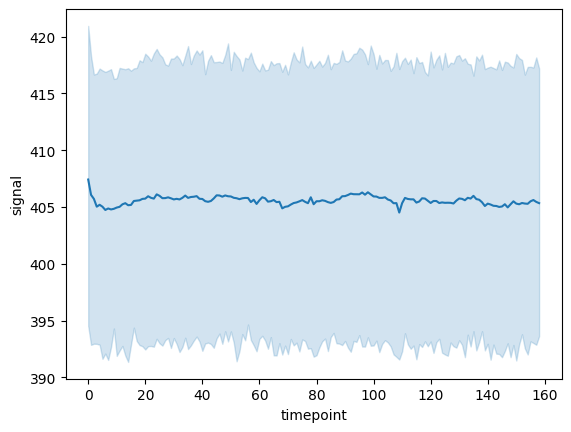

In [138]:
sns.lineplot(x= 'timepoint', y = 'signal', data = time_series_data)

<Axes: xlabel='timepoint', ylabel='signal'>

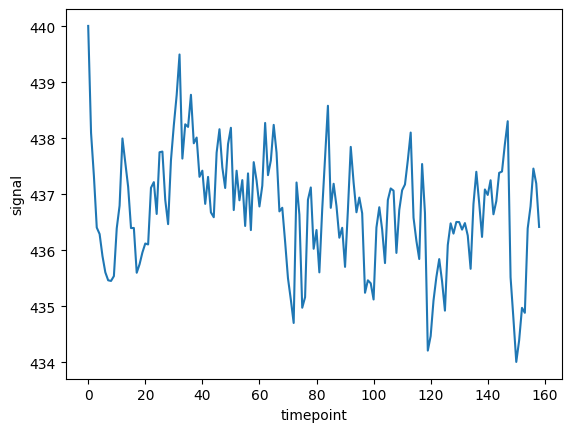

In [139]:

sns.lineplot(x= 'timepoint', y = 'signal', data = sub_time)

<Axes: xlabel='timepoint', ylabel='signal'>

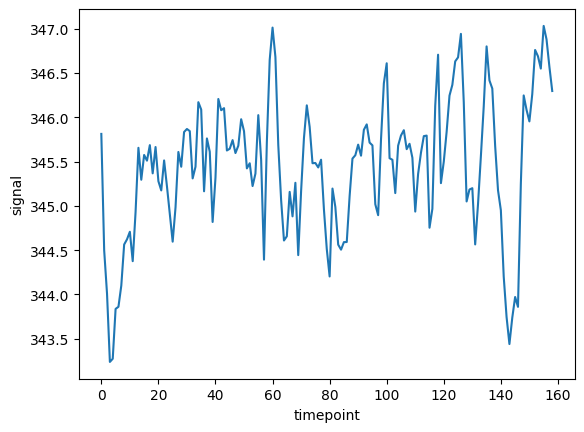

In [141]:
sub_time_data = time_series_data[time_series_data['name'] == sub_all[1]]
sns.lineplot(x= 'timepoint', y = 'signal', data = sub_time_data)

### Beta in different runs to compare the activation

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

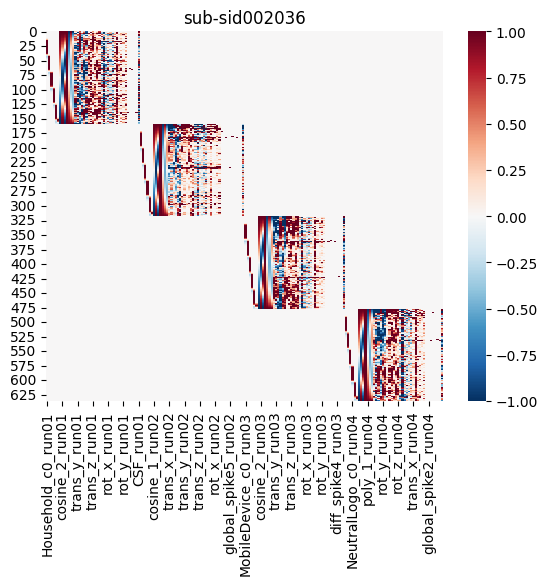

<Figure size 640x480 with 0 Axes>

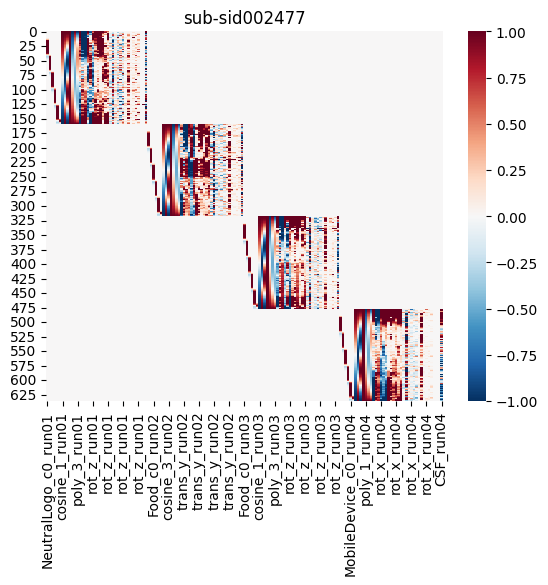

<Figure size 640x480 with 0 Axes>

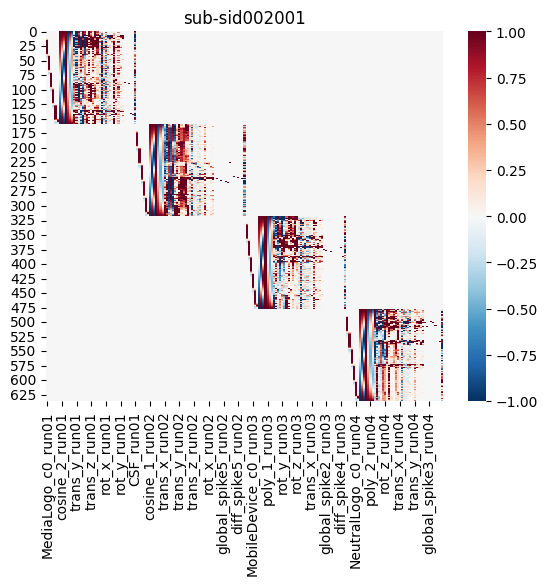

<Figure size 640x480 with 0 Axes>

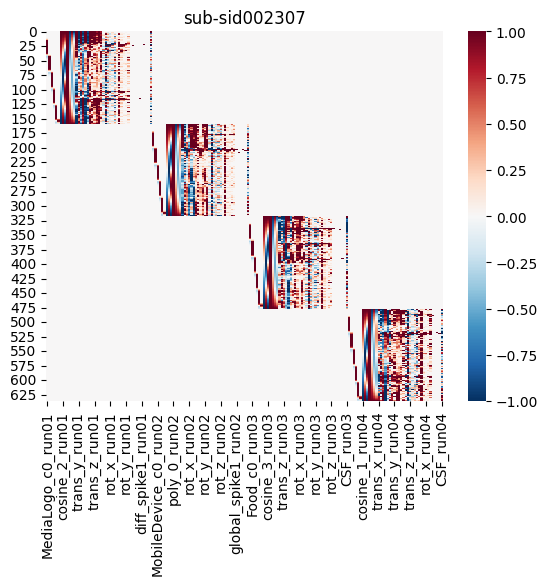

<Figure size 640x480 with 0 Axes>

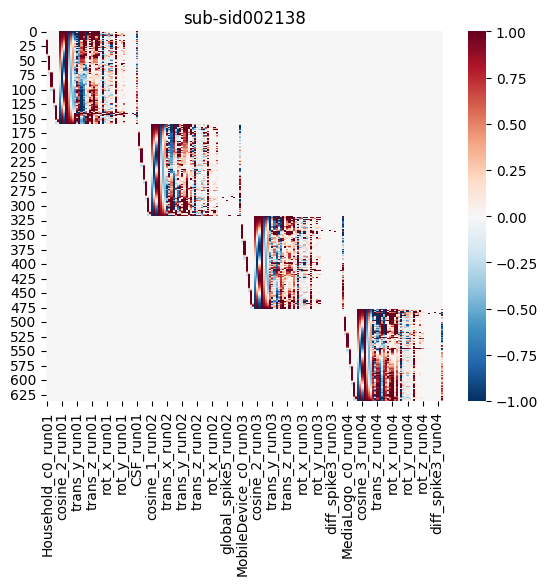

<Figure size 640x480 with 0 Axes>

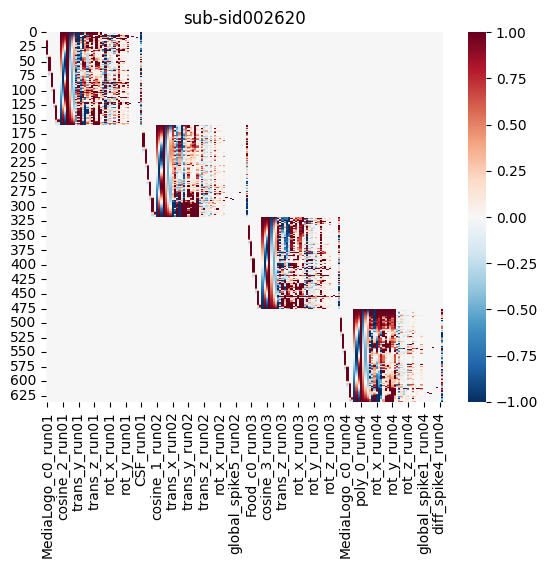

<Figure size 640x480 with 0 Axes>

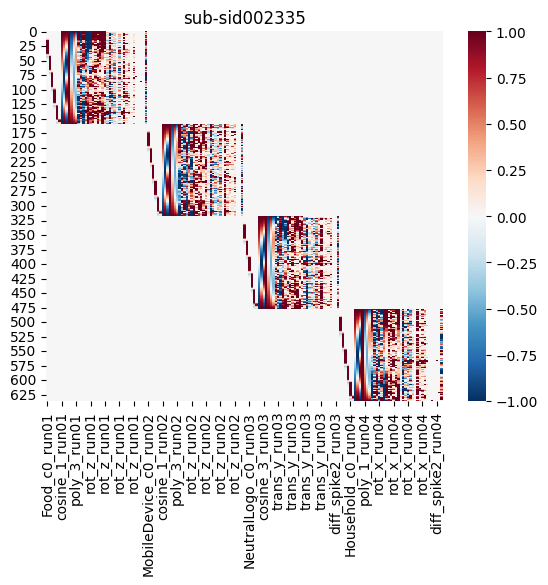

<Figure size 640x480 with 0 Axes>

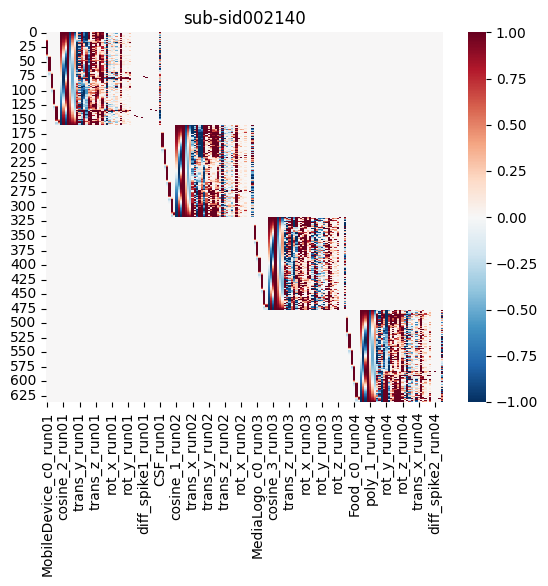

<Figure size 640x480 with 0 Axes>

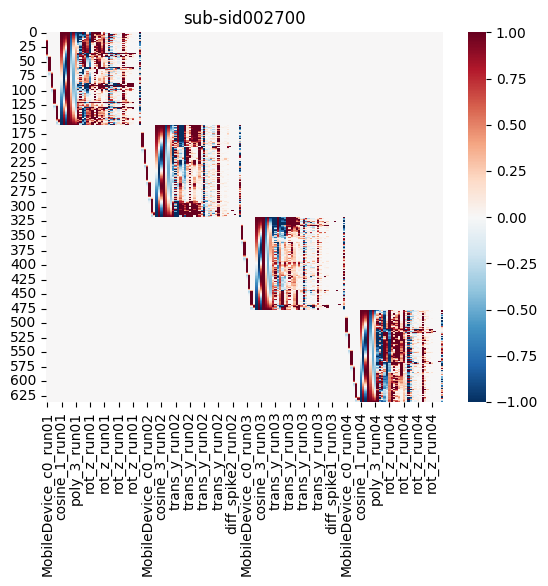

<Figure size 640x480 with 0 Axes>

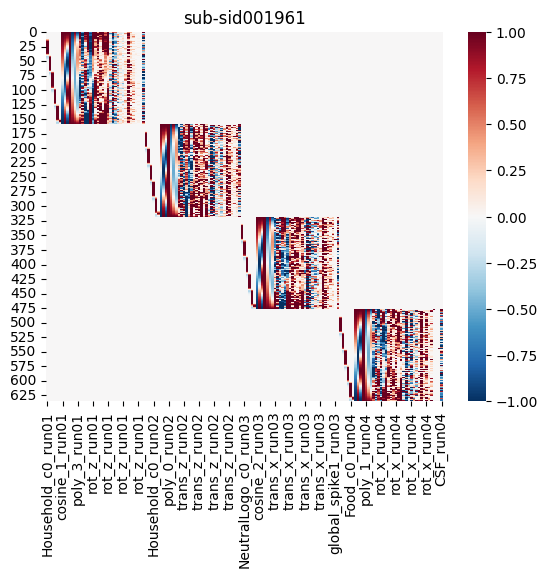

<Figure size 640x480 with 0 Axes>

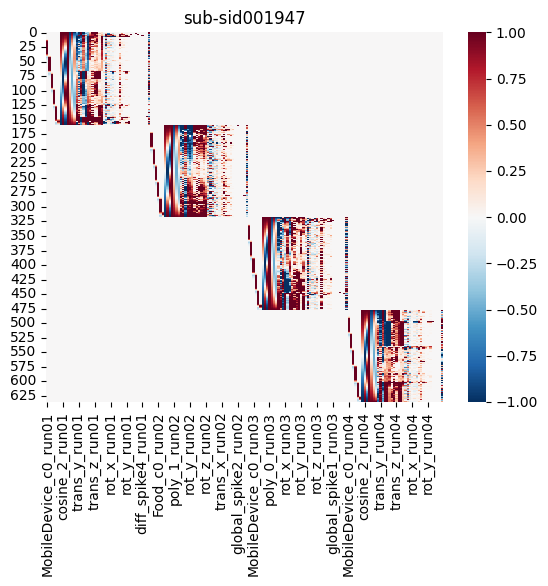

<Figure size 640x480 with 0 Axes>

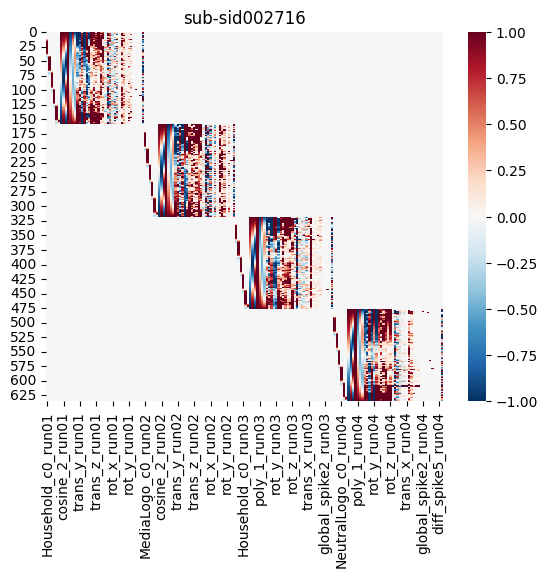

<Figure size 640x480 with 0 Axes>

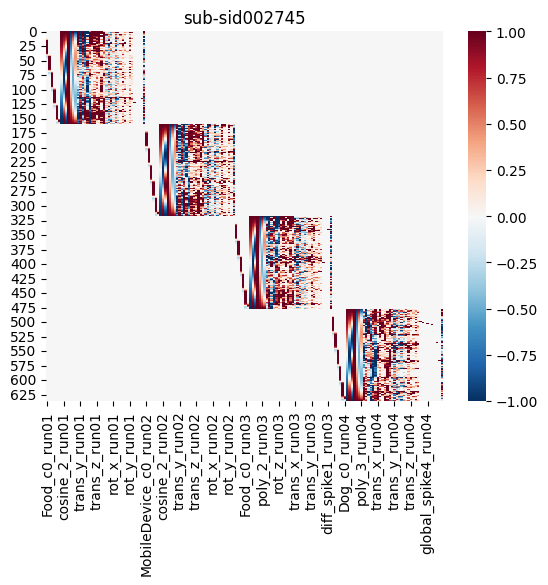

<Figure size 640x480 with 0 Axes>

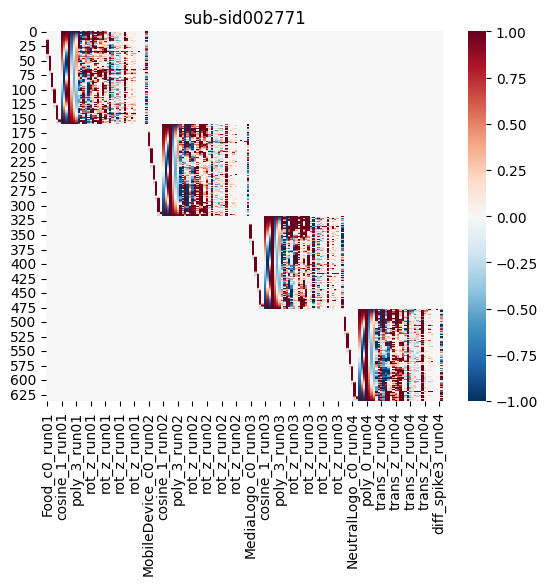

<Figure size 640x480 with 0 Axes>

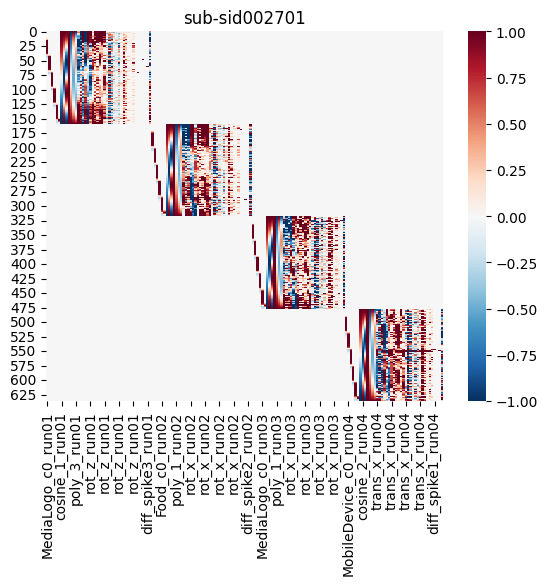

<Figure size 640x480 with 0 Axes>

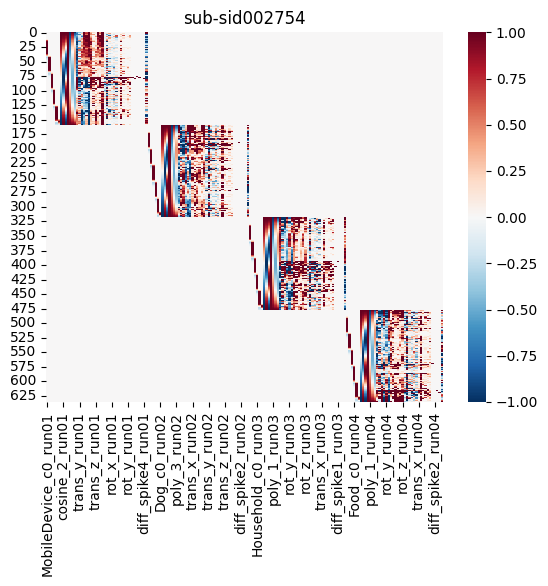

<Figure size 640x480 with 0 Axes>

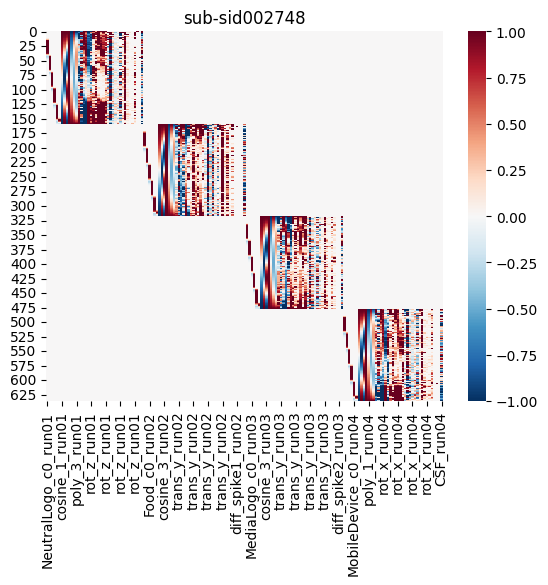

<Figure size 640x480 with 0 Axes>

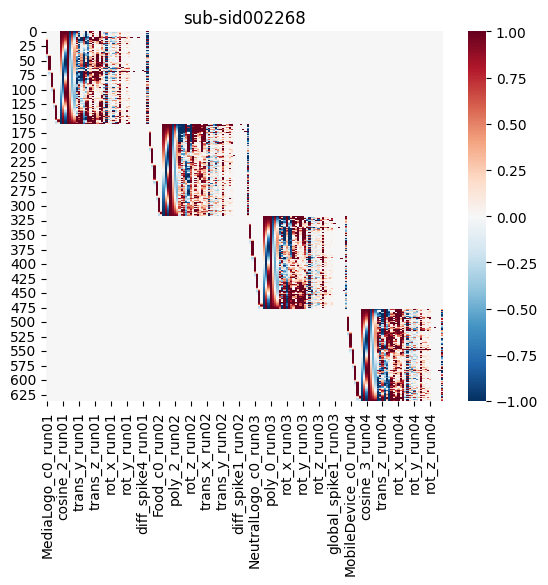

<Figure size 640x480 with 0 Axes>

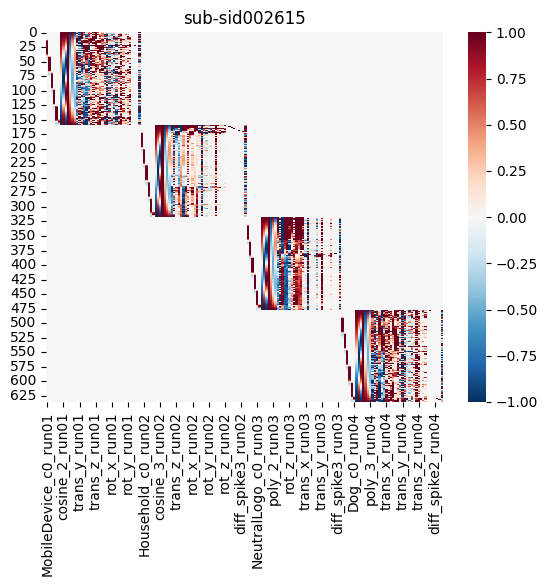

<Figure size 640x480 with 0 Axes>

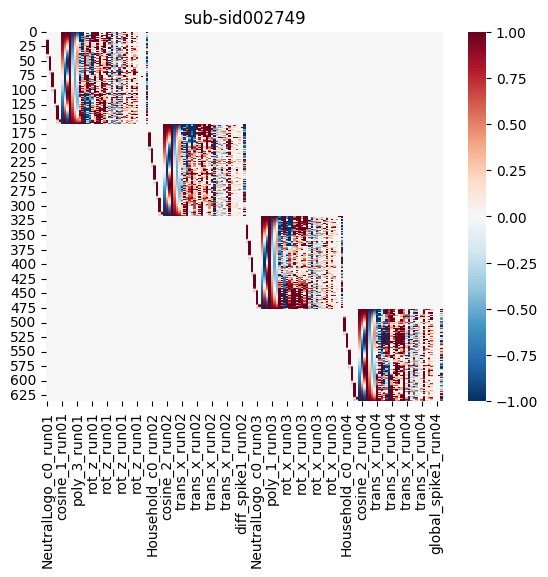

<Figure size 640x480 with 0 Axes>

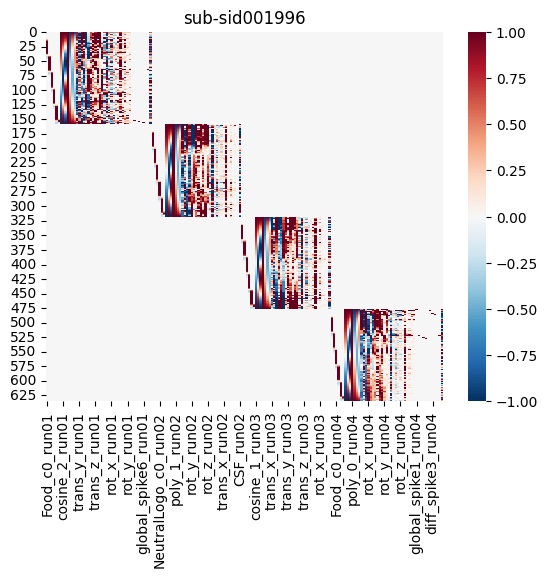

<Figure size 640x480 with 0 Axes>

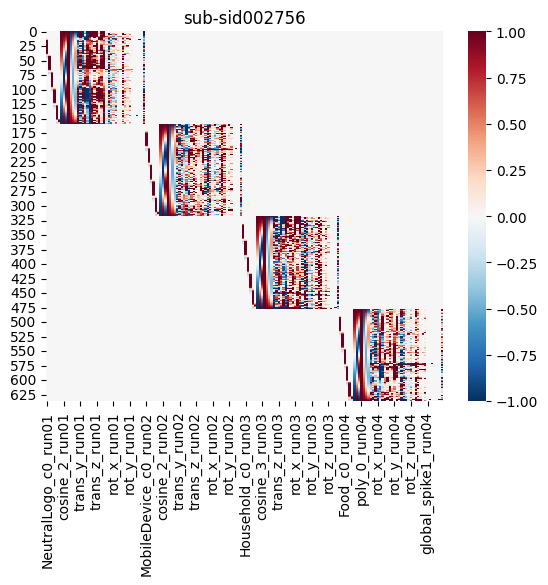

<Figure size 640x480 with 0 Axes>

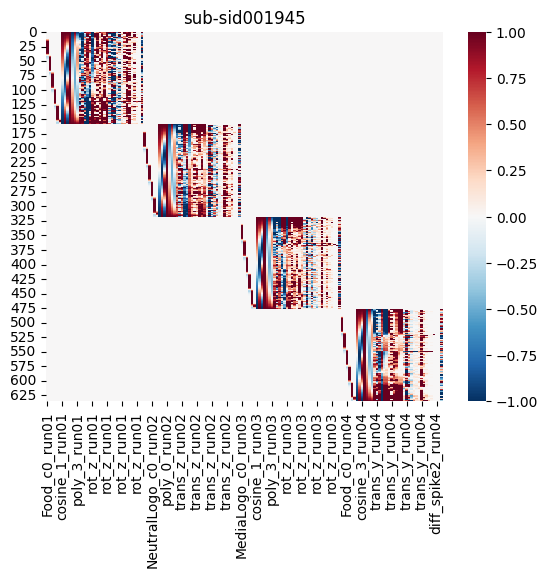

<Figure size 640x480 with 0 Axes>

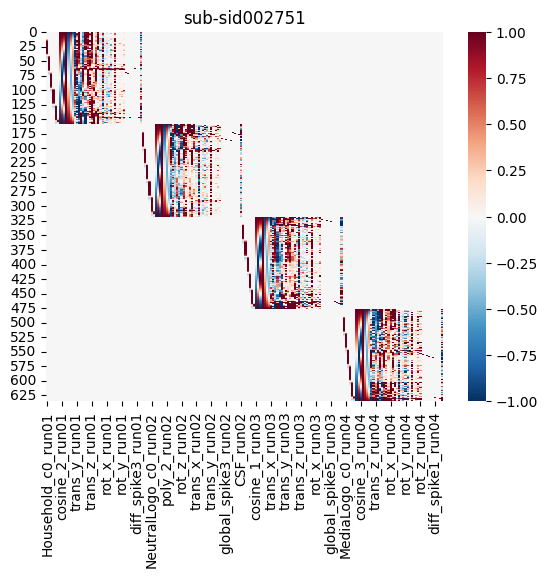

<Figure size 640x480 with 0 Axes>

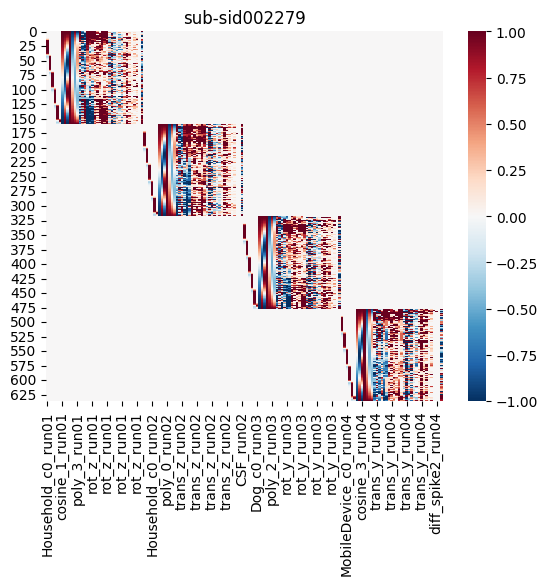

<Figure size 640x480 with 0 Axes>

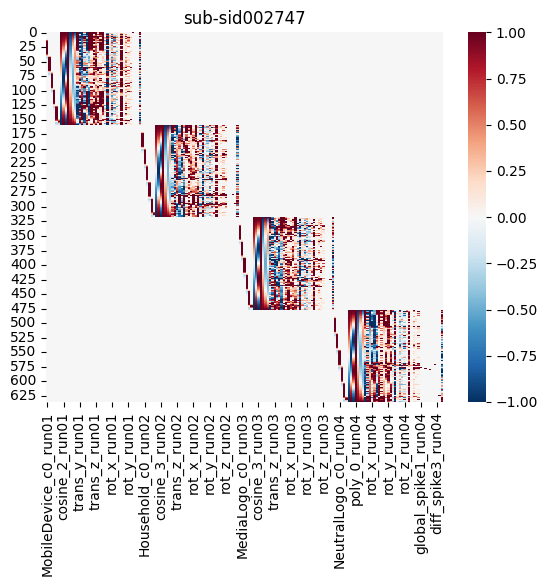

<Figure size 640x480 with 0 Axes>

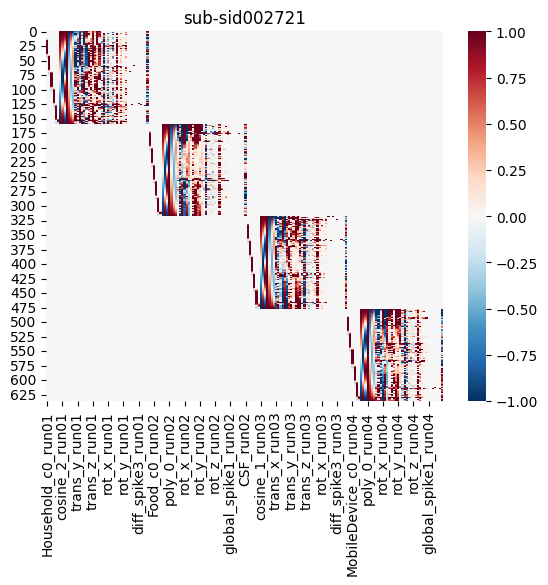

<Figure size 640x480 with 0 Axes>

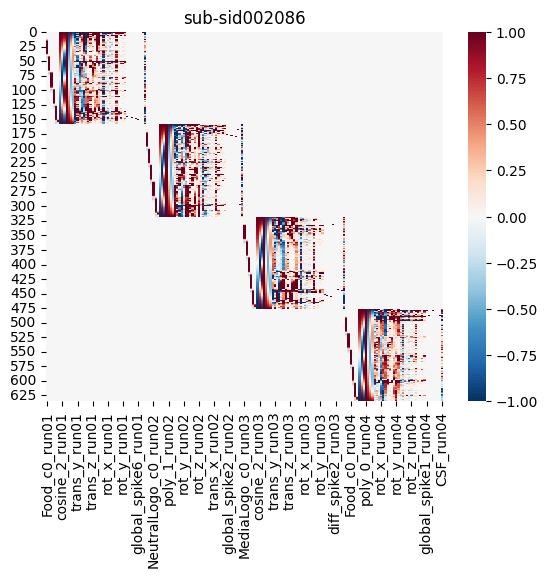

<Figure size 640x480 with 0 Axes>

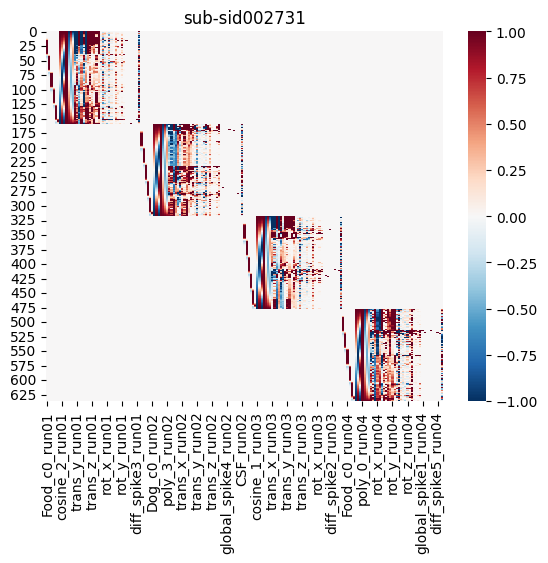

<Figure size 640x480 with 0 Axes>

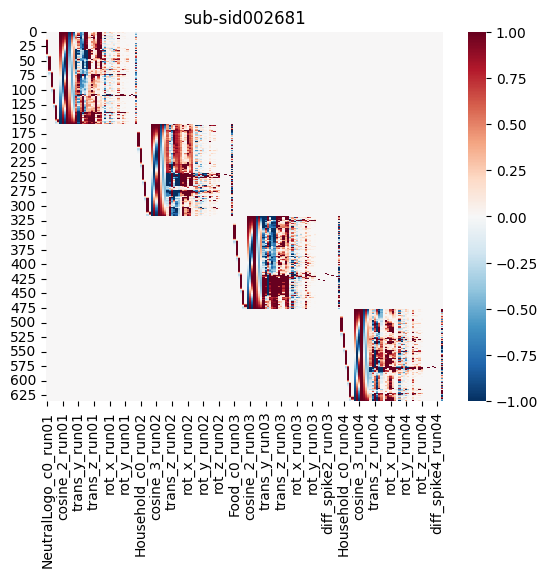

<Figure size 640x480 with 0 Axes>

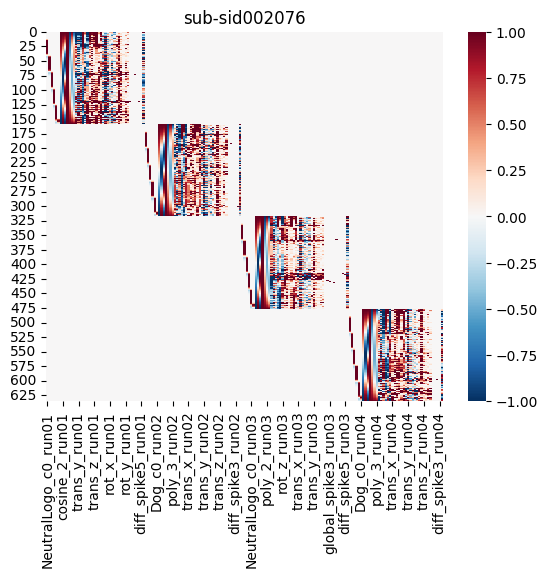

<Figure size 640x480 with 0 Axes>

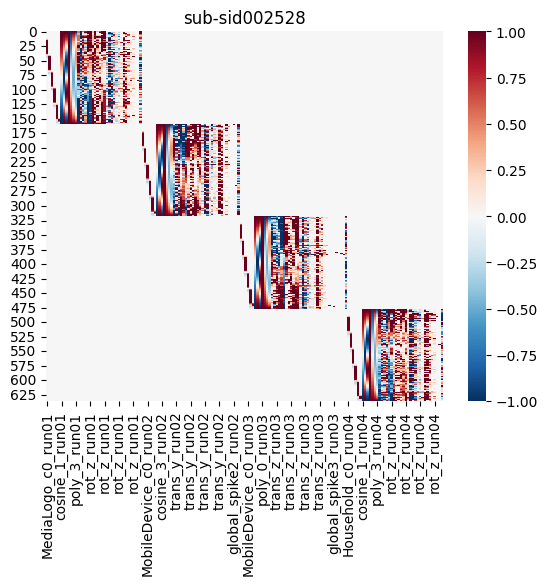

<Figure size 640x480 with 0 Axes>

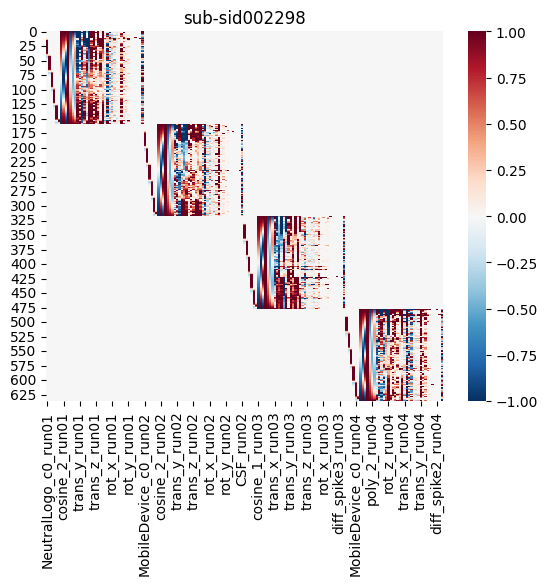

<Figure size 640x480 with 0 Axes>

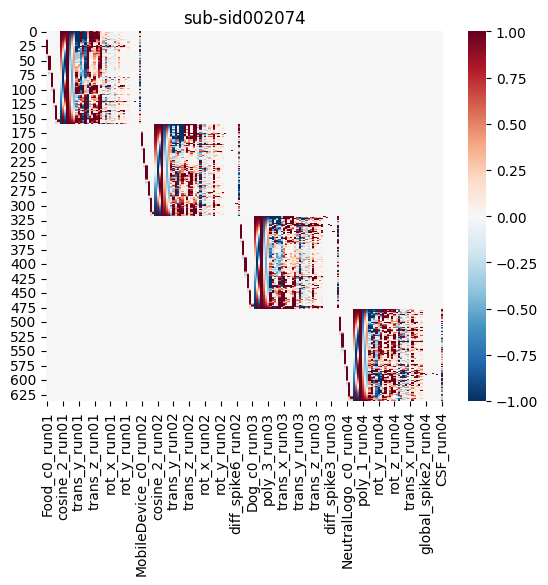

<Figure size 640x480 with 0 Axes>

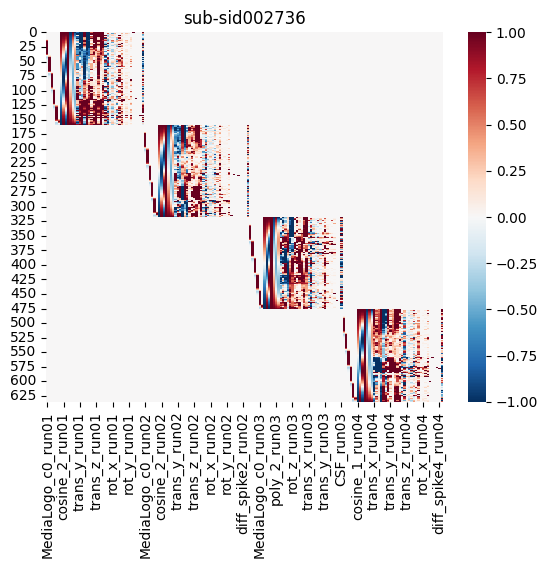

In [124]:
path_to_output_smoothed_runs = '/Volumes/Shaolin/modernmedia_menghan/denoised/smoothed_runs/beta'
conditions = ['Household','MobileDevice','NeutralLogo','Food','MediaLogo']


for sub in tqdm(sub_all):
    dm_all = pd.DataFrame()
    dm_all_title = []
    f_data = Brain_Data()
    for run in tqdm(runs):
    
        functional_run_data = glob.glob(os.path.join(path_to_cases,'derivatives',f'{sub}','func',f'{sub}_task-logo_run-{run}*_bold.nii.gz'))
        run_data = Brain_Data(functional_run_data)
        smthd_run_data = run_data.smooth(fwhm=smooth)
        n_tr = run_data.data.shape[0]
        f_data = f_data.append(smthd_run_data)
    
        Event_data = glob.glob(os.path.join(path_to_timing,f'{sub}_task-logo_run-{run}_events.tsv'))
        onsets = pd.read_csv(Event_data[0], sep='\t')
        onsets.columns = ['Onset', 'Duration', 'Stim']
        dm = onsets_to_dm(onsets, sampling_freq=1/tr, run_length=n_tr)
        dm = dm[dm.columns.drop(list(dm.filter(regex='Fix')))] ## drop fixation condition
    
        dm_cov = dm.convolve()
        dm_cov_filt_poly = dm_cov.add_dct_basis(128).add_poly(order=3, include_lower=True)
    
        # Identify Spikes
        spikes = run_data.find_spikes(global_spike_cutoff=outlier_cutoff, diff_spike_cutoff=outlier_cutoff)
        spikes = Design_Matrix(spikes.iloc[:,1:], sampling_freq=1/tr)
    
        # Load fMRIprep Confounds
        confounds = pd.read_csv(os.path.join(path_to_cases,'derivatives', sub, 'func', f'{sub}_task-logo_run-{run}_desc-confounds_timeseries.tsv'), sep='\t')
    
        # motion covars
        mc = confounds[['trans_x','trans_y','trans_z','rot_x', 'rot_y', 'rot_z']]
        mc_cov = make_motion_covariates(mc, tr)
    
        dm_conv_filt_poly_cov = dm_cov_filt_poly.append(mc_cov, axis=1).append(spikes, axis=1)
        dm_conv_filt_poly_cov['CSF'] = zscore(pd.Series(run_data.extract_roi(csf.threshold(upper=0.85, binarize=True))))
        # dm_conv_filt_poly_cov.heatmap(cmap='RdBu_r', vmin=-1,vmax=1)     
        dm_all = pd.DataFrame(block_diag(dm_all,dm_conv_filt_poly_cov))
    
        dm_title = dm_conv_filt_poly_cov.columns.tolist()
        dm_title_new =[ i + '_run' + str(run) for i in dm_title]
        dm_all_title.extend(dm_title_new)

    dm_all.columns = dm_all_title

    plt.figure()
    sub_fig, _ = plt.subplots()
    sns.heatmap(dm_all,cmap='RdBu_r', vmin=-1,vmax=1).set(title=sub)
    f_data.X = dm_all
    stats_data = f_data.regress()

    for run_name in runs:

        # conditions = ['Household','MobileDevice','NeutralLogo','Food','MediaLogo']
        # condition_run = conditions[]+'_c0_run'+str(run_name)
        
        # Household
        condition_run_Household = conditions[0]+'_c0_run'+str(run_name)
        Household = np.where(f_data.X.columns.str.contains(condition_run_Household),1,0)
        Household_data = stats_data['beta'] * Household
            
        # MobileDevice
        condition_run_MobileDevice = conditions[1]+'_c0_run'+str(run_name)
        MobileDevice = np.where(f_data.X.columns.str.contains(condition_run_MobileDevice),1,0)
        MobileDevice_data = stats_data['beta'] * MobileDevice
        
        # NeutralLogo
        condition_run_NeutralLogo = conditions[2]+'_c0_run'+str(run_name)
        NeutralLogo = np.where(f_data.X.columns.str.contains(condition_run_NeutralLogo),1,0)
        NeutralLogo_data = stats_data['beta'] * NeutralLogo
        
        # Food
        condition_run_Food = conditions[3]+'_c0_run'+str(run_name)
        Food = np.where(f_data.X.columns.str.contains(condition_run_Food),1,0)
        food_data = stats_data['beta'] * Food
        
        # MediaLogo
        condition_run_MediaLogo = conditions[4]+'_c0_run'+str(run_name)
        MediaLogo = np.where(f_data.X.columns.str.contains(condition_run_MediaLogo),1,0)
        MediaLogo_data = stats_data['beta'] * MediaLogo
        
        ## save the data
        Household_data.data = np.float32(Household_data.data) # cast as float32 to reduce storage space
        MobileDevice_data.data = np.float32(MobileDevice_data.data)
        NeutralLogo_data.data = np.float32(NeutralLogo_data.data)
        MediaLogo_data.data = np.float32(MediaLogo_data.data)
        food_data.data = np.float32(food_data.data)
    
        Household_data.write(os.path.join(path_to_output_smoothed_runs, f'{sub}_Household_beta_run-{run_name}.nii.gz'))
        MobileDevice_data.write(os.path.join(path_to_output_smoothed_runs, f'{sub}_MobileDevice_beta_run-{run_name}.nii.gz'))
        NeutralLogo_data.write(os.path.join(path_to_output_smoothed_runs, f'{sub}_NeutralLogo_beta_run-{run_name}.nii.gz'))
        MediaLogo_data.write(os.path.join(path_to_output_smoothed_runs, f'{sub}_MediaLogo_beta_run-{run_name}.nii.gz'))
        food_data.write(os.path.join(path_to_output_smoothed_runs, f'{sub}_Food_beta_run-{run_name}.nii.gz'))
        
    




